## MSc Business Analytics & Management - Thesis: Time is Money

#### Authored by Benjamin Aston on 15/06/2025

## Run experiment

#### IMPORT PACKAGES

In [5]:
import numpy as np
import pandas as pd
import torch
import torch.nn as nn
import torch.nn.functional as F
from sklearn.model_selection import train_test_split, KFold
from sklearn.preprocessing import LabelEncoder, StandardScaler, MinMaxScaler
from sklearn.metrics import mean_squared_error
from sklearn.ensemble import RandomForestRegressor
from sklearn.decomposition import PCA
from scipy import stats
from scipy.stats import qmc
from scipy.spatial.distance import pdist
from scipy.spatial import ConvexHull
from mpl_toolkits.mplot3d.art3d import Poly3DCollection
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
import seaborn as sns
from skimpy import skim
from ydata_profiling import ProfileReport
import sweetviz as sv
from econml.dml import CausalForestDML
from dowhy import CausalModel
import networkx as nx
import seaborn as sns
from itertools import product
import torch.optim as optim
from matplotlib import gridspec
import os
from scipy.stats import pearsonr

#### Define function to get pred vs actual

In [7]:
def plot_pred_vs_true(true_cates, pred_cates, model_name="Model", save_path=None):
    true_cates = np.array(true_cates)
    pred_cates = np.array(pred_cates)
    
    plt.figure(figsize=(6, 6))
    plt.scatter(true_cates, pred_cates, alpha=0.7, label="CATEs")
    plt.plot([true_cates.min(), true_cates.max()],
             [true_cates.min(), true_cates.max()],
             '--', color='gray', label='Ideal')

    pehe = np.sqrt(np.mean((true_cates - pred_cates) ** 2))
    plt.xlabel("True CATE")
    plt.ylabel("Predicted CATE")
    plt.title(f"{model_name} – Predicted vs True CATEs\nPEHE: {pehe:.4f}")
    plt.grid(True)
    plt.legend()

    if save_path:
        plt.savefig(save_path, bbox_inches='tight')
        print(f"✅ Saved to {save_path}")
    else:
        plt.show()


#### Function to get uncertainty estimate during BO exploration

In [9]:
def estimate_uncertainty(model, X):
    """
    Estimates uncertainty by calculating the standard deviation of predictions from each tree in the forest.
    """
    all_preds = np.stack([tree.predict(X) for tree in model.estimators_], axis=0)
    return np.mean(all_preds, axis=0), np.std(all_preds, axis=0)

#### Normalise the variables

In [11]:
# Normalize variables for generating synthetic execution times
def normalize(col):
    return (col - col.min()) / (col.max() - col.min())

#### GENERATE CONFIGS

In [13]:
#Configuration generation process
# Define min, max
db_min, db_max = 250, 2500
mas_min, mas_max = 10, 80
par_min, par_max = 2, 10

# Compute bin width
db_bins = np.linspace(db_min, db_max, 13)
mas_bins = np.linspace(mas_min, mas_max, 13)
par_bins = np.linspace(par_min, par_max, 13)

# Get midpoints
db_mid = (db_bins[:-1] + db_bins[1:]) / 2
mas_mid = (mas_bins[:-1] + mas_bins[1:]) / 2
par_mid = (par_bins[:-1] + par_bins[1:]) / 2

# Create full grid
configurations = np.array(np.meshgrid(db_mid, mas_mid, par_mid)).T.reshape(-1, 3)

#### GENERATE DATA FOR CONFIGS

In [15]:
# Generate configuration grid
db_memory = np.linspace(250, 2500, 12)
mas_workers = np.linspace(10, 80, 12)
parallel_jobs = np.linspace(2, 10, 12)

configs = pd.DataFrame(list(product(db_memory, mas_workers, parallel_jobs)),
                       columns=["DB_Memory", "MAS_Workers", "Parallel_Jobs"])

# Create config ID
configs["Configuration"] = ["Config_" + str(i + 1) for i in range(len(configs))]

# Normalize treatment space for interpolation
scaler_treatments = MinMaxScaler()
normalized_treatment_vectors = scaler_treatments.fit_transform(configs[["DB_Memory", "MAS_Workers", "Parallel_Jobs"]])
treatment_vectors = pd.DataFrame(normalized_treatment_vectors, columns=["DB", "MAS", "PAR"])
treatment_vectors["Configuration"] = ["Config_" + str(i + 1) for i in range(len(configs))]
treatment_vectors["Treatment_ID"] = LabelEncoder().fit_transform(treatment_vectors["Configuration"])

# Add constant columns
configs["model_type"] = "CPF"
configs["request_size"] = "16KB"
configs["db_norm"] = normalize(configs["DB_Memory"])
configs["mas_norm"] = normalize(configs["MAS_Workers"])
configs["par_norm"] = normalize(configs["Parallel_Jobs"])

# Df 1 - No relationship (pure noise) - None
configs["execution_time_none"] = np.random.normal(loc=50, scale=5, size=len(configs))

# Df2 Some relationship (additive) - 'Some'
configs["execution_time_some"] = (
    60
    - 10 * configs["mas_norm"]
    + 5 * configs["par_norm"]
    + 8 * configs["db_norm"]
    + np.random.normal(loc=0, scale=2, size=len(configs))
)

#  Df3 - Full relationship (nonlinear + interaction terms)
configs["execution_time_full"] = (
    100
    - 25 * configs["mas_norm"]
    + 15 * configs["db_norm"]
    + 10 * configs["par_norm"]
    - 20 * configs["mas_norm"] * configs["db_norm"]
    + 10 * np.sin(2 * np.pi * configs["par_norm"])
    + 5 * configs["db_norm"] ** 2
    + 7 * configs["mas_norm"] * configs["par_norm"]
    + np.random.normal(loc=0, scale=1.5, size=len(configs))
)

final_cols = ["Configuration", "DB_Memory", "MAS_Workers", "Parallel_Jobs", "model_type", "request_size",
              "execution_time_none", "execution_time_some", "execution_time_full"]

##############
#Be aware, that in order to run the script for the different types of execution times generated (some, full, etc...), 
#you must uncomment all of the selected values that you want and comment our the code related to the other dfs
##############

#Uncomment for no interaction data
# execution_results = configs.drop(columns=["execution_time_some", "execution_time_full"]).copy()
# execution_results.rename(columns={"execution_time_none": "Execution_Time"}, inplace=True)

#Uncomment for some interaction data
# execution_results = configs.drop(columns=["execution_time_none", "execution_time_full"]).copy()
# execution_results.rename(columns={"execution_time_some": "Execution_Time"}, inplace=True)

#Uncomment for full interaction data
execution_results = configs.drop(columns=["execution_time_none", "execution_time_some"]).copy()
execution_results.rename(columns={"execution_time_full": "Execution_Time"}, inplace=True)

# Remove control config (e.g. "Config_328") from sampling pool so that we do not sample it as a potential treatment too
control_config_id = "Config_328"

# Exclude from sampling pool
configs_no_control = configs[configs["Configuration"] != control_config_id].copy()
execution_results = execution_results[execution_results["Configuration"] != control_config_id].copy()
execution_results

,DB_Memory,MAS_Workers,Parallel_Jobs,Configuration,model_type,request_size,db_norm,mas_norm,par_norm,Execution_Time
0,250.0,10.0,2.000000,Config_1,CPF,16KB,0.0,0.0,0.000000,100.828768
1,250.0,10.0,2.727273,Config_2,CPF,16KB,0.0,0.0,0.090909,109.510884
2,250.0,10.0,3.454545,Config_3,CPF,16KB,0.0,0.0,0.181818,114.206626
3,250.0,10.0,4.181818,Config_4,CPF,16KB,0.0,0.0,0.272727,110.417044
4,250.0,10.0,4.909091,Config_5,CPF,16KB,0.0,0.0,0.363636,112.513967
...,...,...,...,...,...,...,...,...,...,...
1723,2500.0,80.0,7.090909,Config_1724,CPF,16KB,1.0,1.0,0.636364,75.987215
1724,2500.0,80.0,7.818182,Config_1725,CPF,16KB,1.0,1.0,0.727273,77.987902
1725,2500.0,80.0,8.545455,Config_1726,CPF,16KB,1.0,1.0,0.818182,79.494527
1726,2500.0,80.0,9.272727,Config_1727,CPF,16KB,1.0,1.0,0.909091,85.871394


### Phase 1: Sampling

#### EXECUTE LHS AND BO PROCESS

{'Mean Pairwise Distance': 887.3916573062297, 'Coverage Score': {'DB_Memory': 1.0, 'MAS_Workers': 1.0, 'Parallel_Jobs': 1.0}, 'Discrepancy Metric': 301412.60852677375}
Starting Bayesian Optimization Iteration 1...


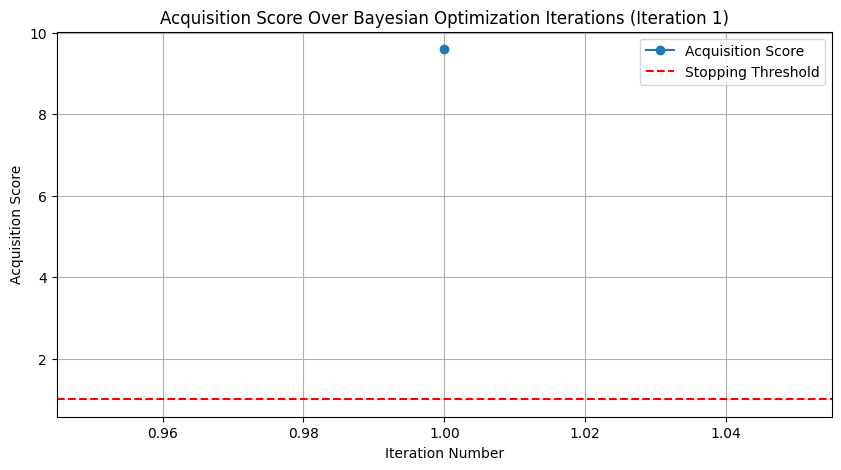

Starting Bayesian Optimization Iteration 2...


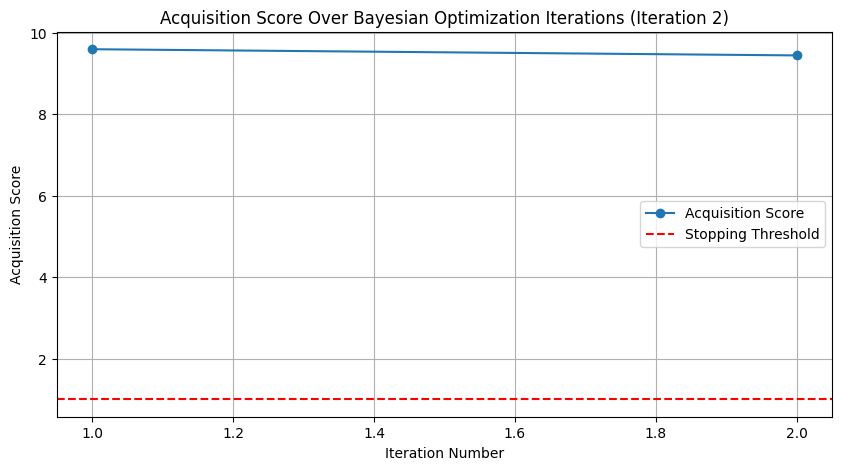

Starting Bayesian Optimization Iteration 3...


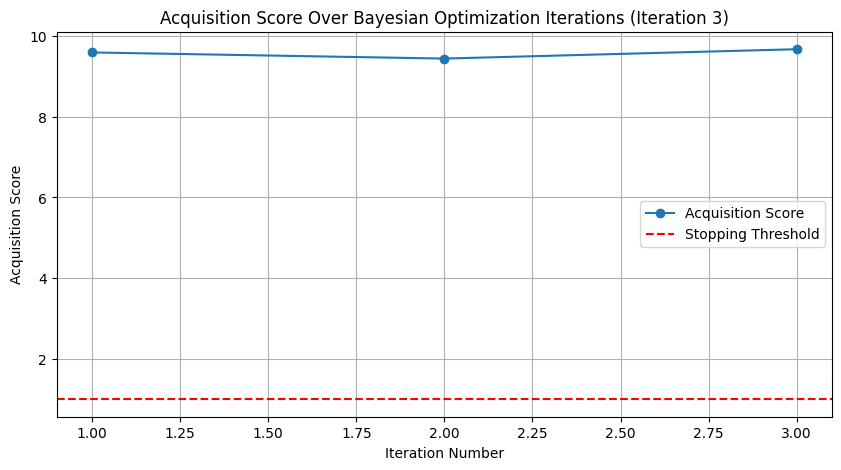

Starting Bayesian Optimization Iteration 4...


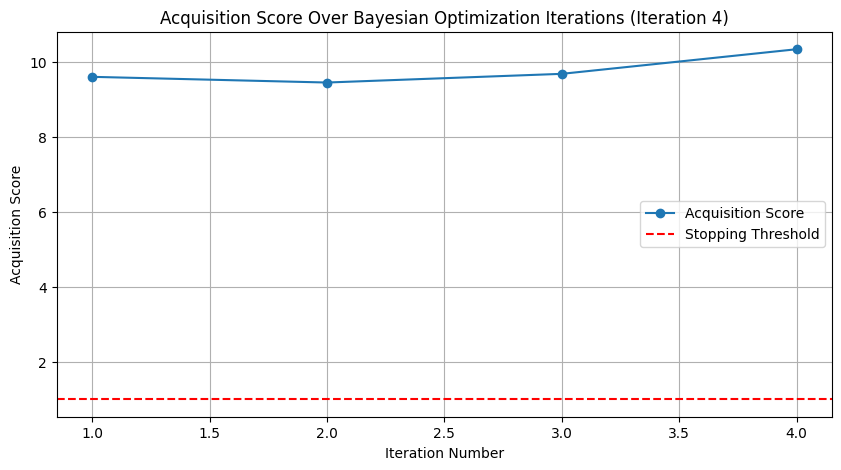

Starting Bayesian Optimization Iteration 5...


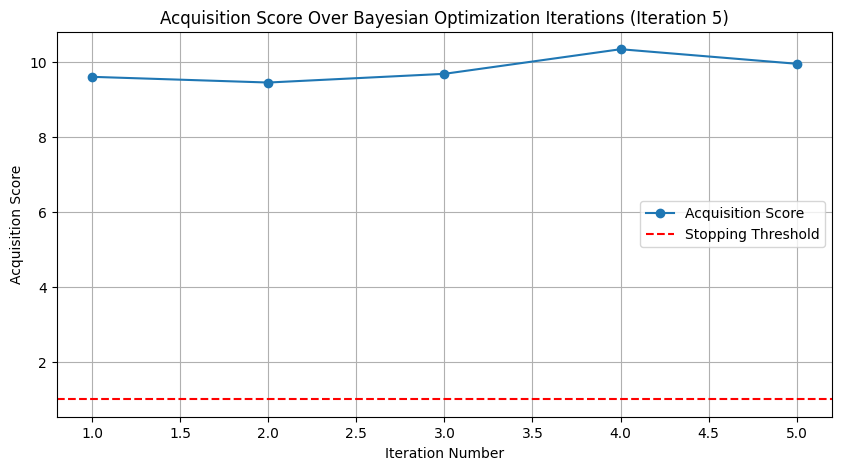

Starting Bayesian Optimization Iteration 6...


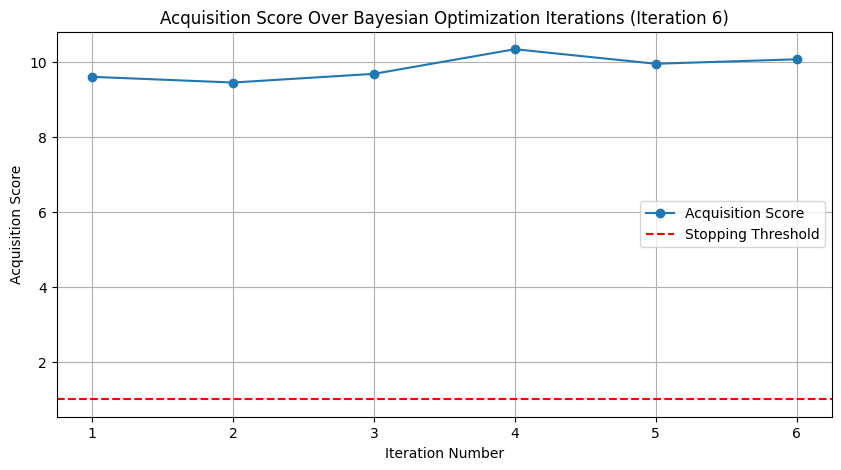

Starting Bayesian Optimization Iteration 7...


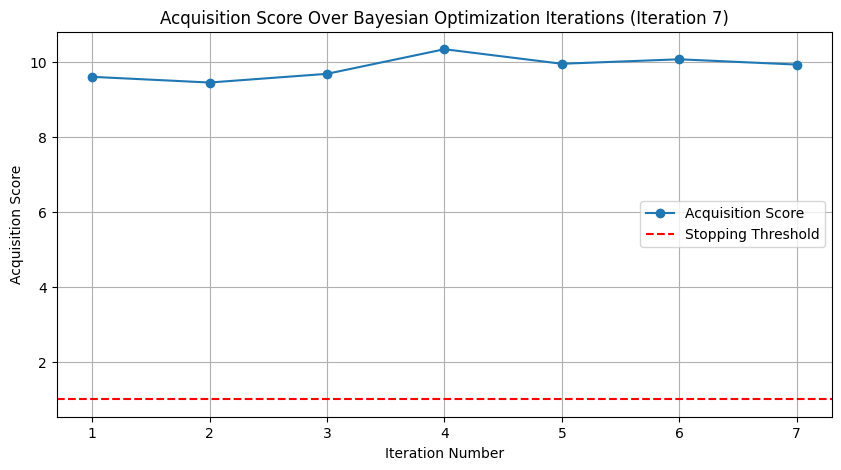

Starting Bayesian Optimization Iteration 8...


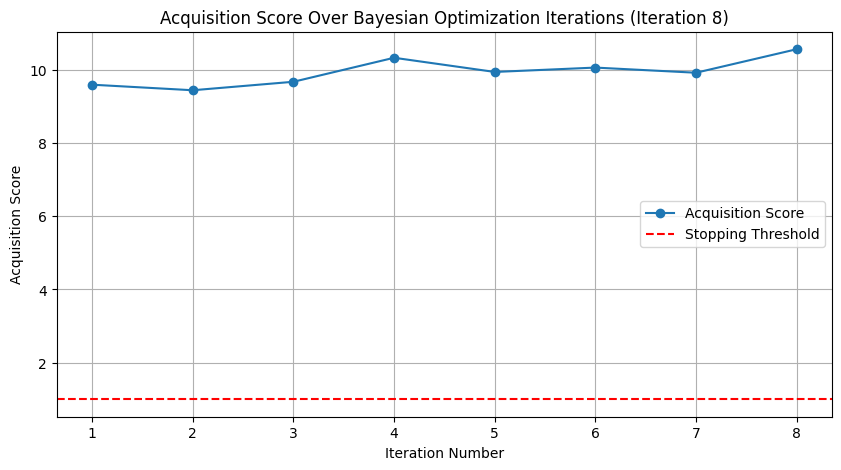

Starting Bayesian Optimization Iteration 9...


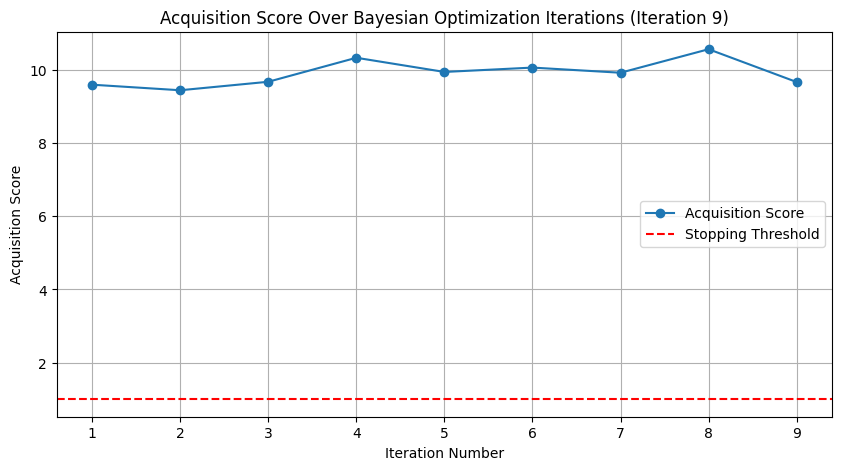

Starting Bayesian Optimization Iteration 10...


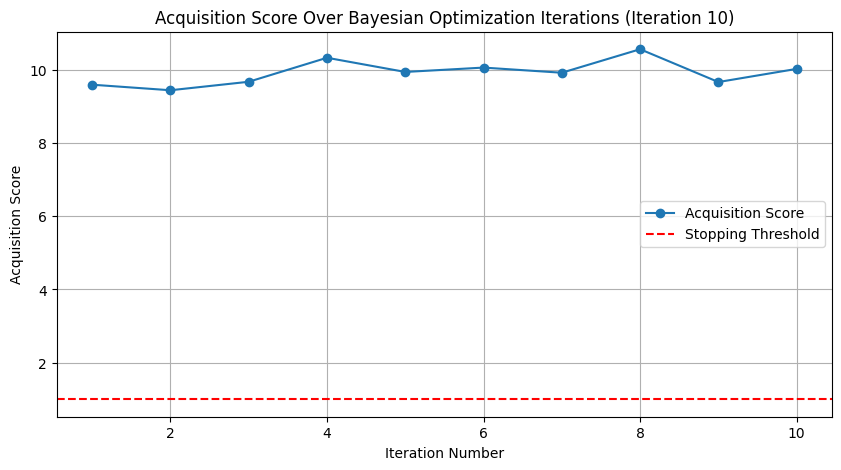

Starting Bayesian Optimization Iteration 11...


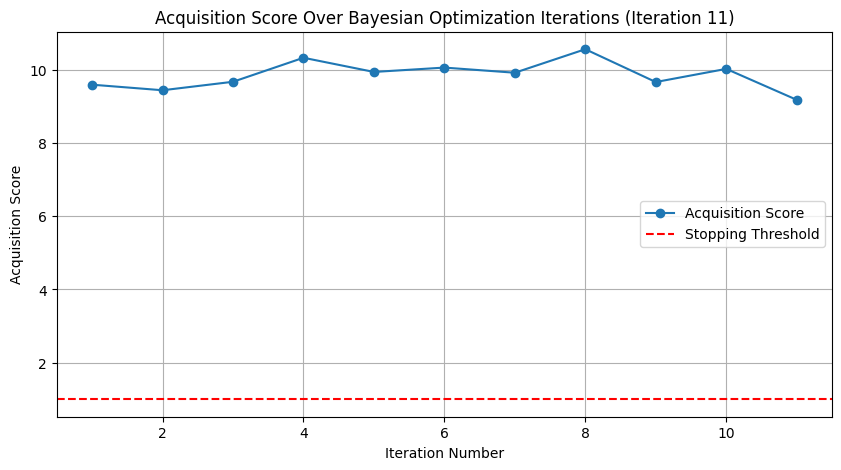

Starting Bayesian Optimization Iteration 12...


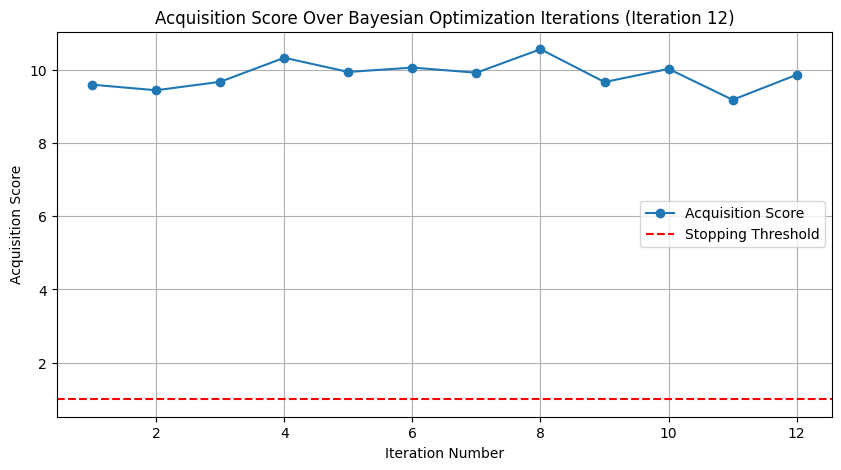

Starting Bayesian Optimization Iteration 13...


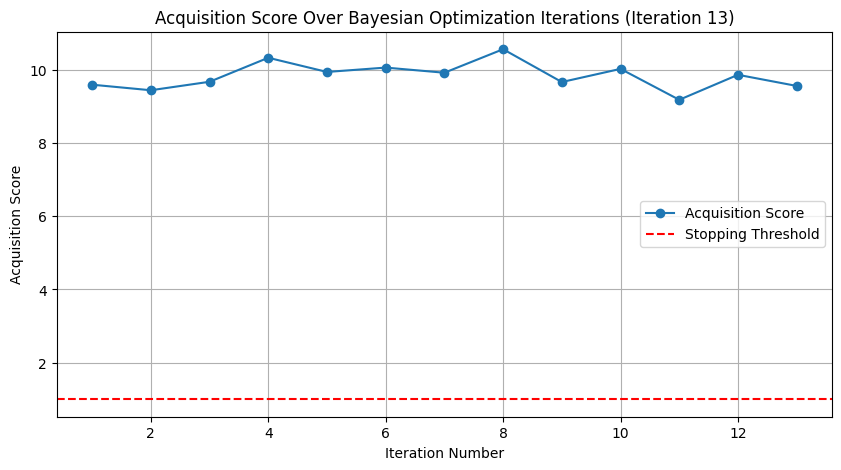

Starting Bayesian Optimization Iteration 14...


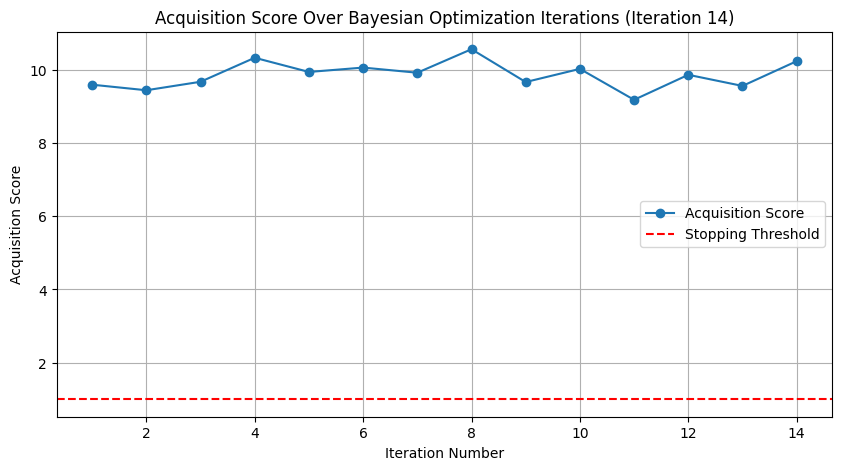

Starting Bayesian Optimization Iteration 15...


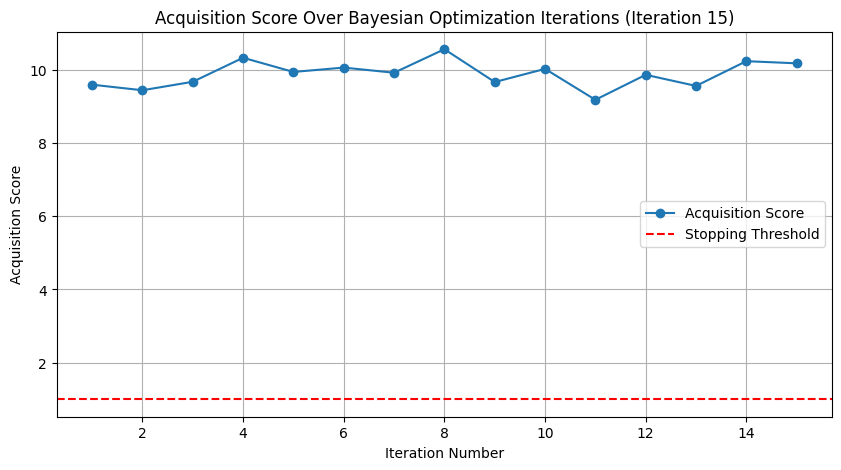

Starting Bayesian Optimization Iteration 16...


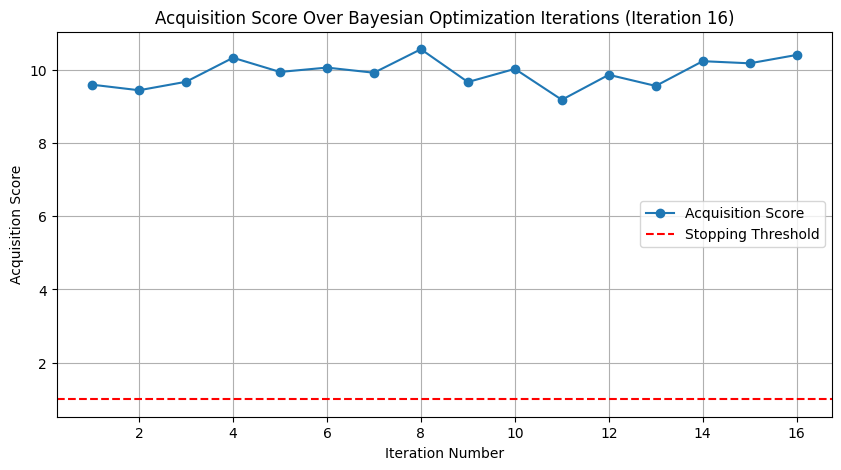

Starting Bayesian Optimization Iteration 17...


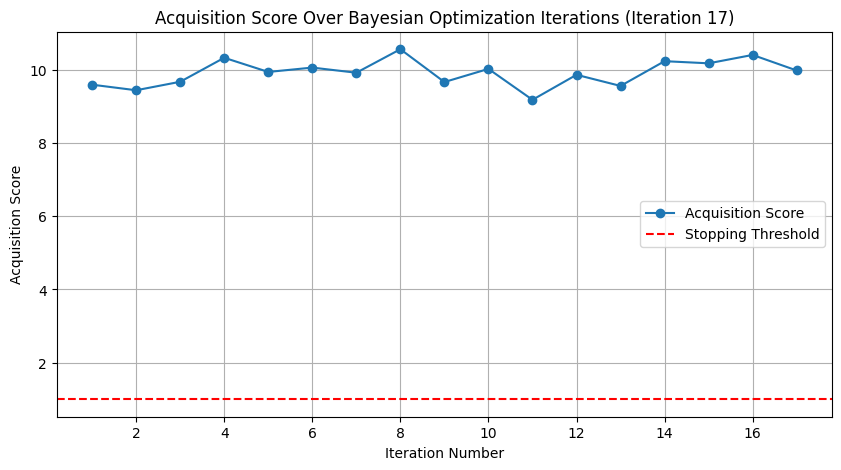

Starting Bayesian Optimization Iteration 18...


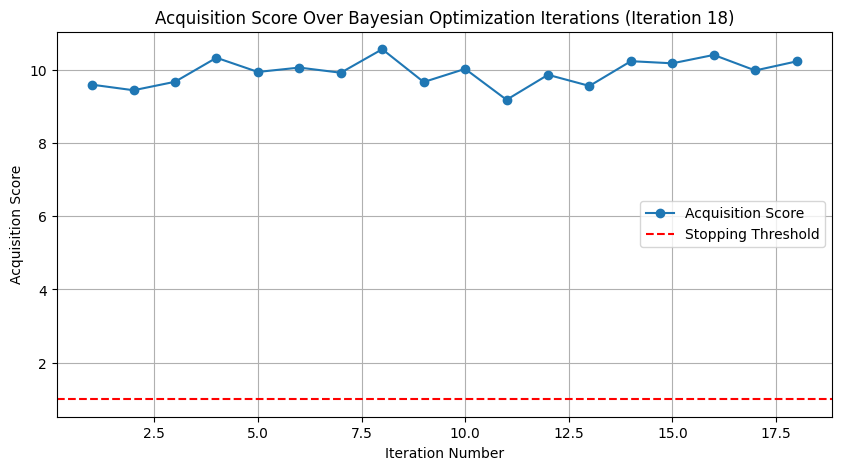

Starting Bayesian Optimization Iteration 19...


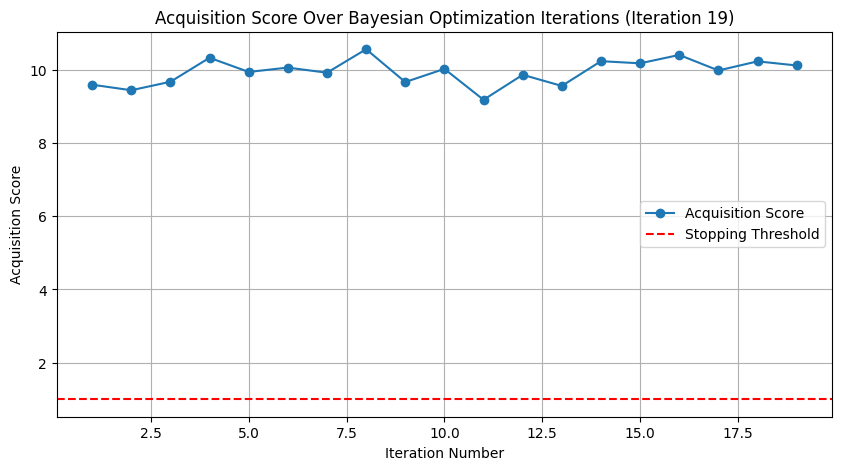

Starting Bayesian Optimization Iteration 20...


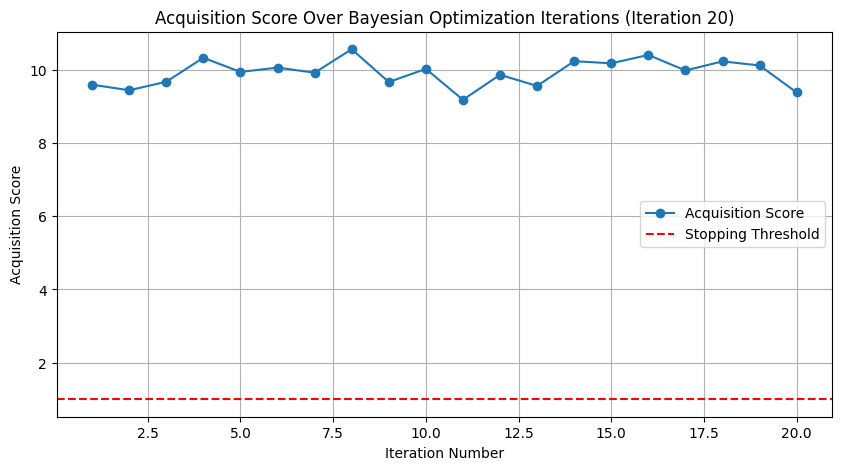

Starting Bayesian Optimization Iteration 21...


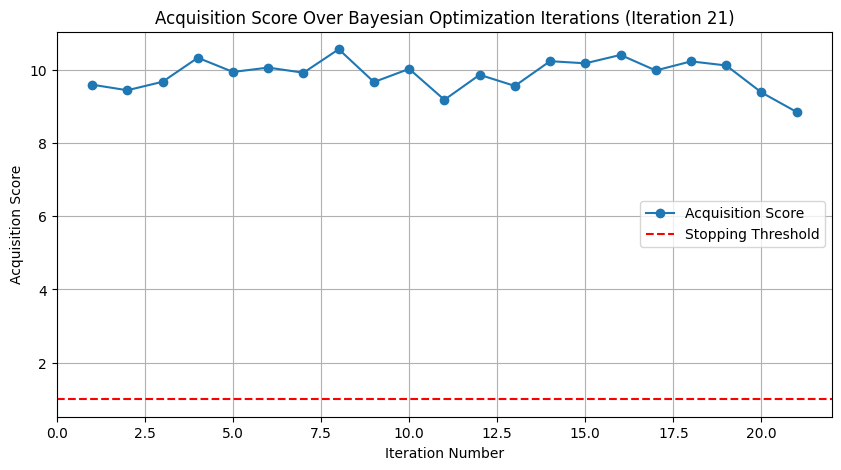

Starting Bayesian Optimization Iteration 22...


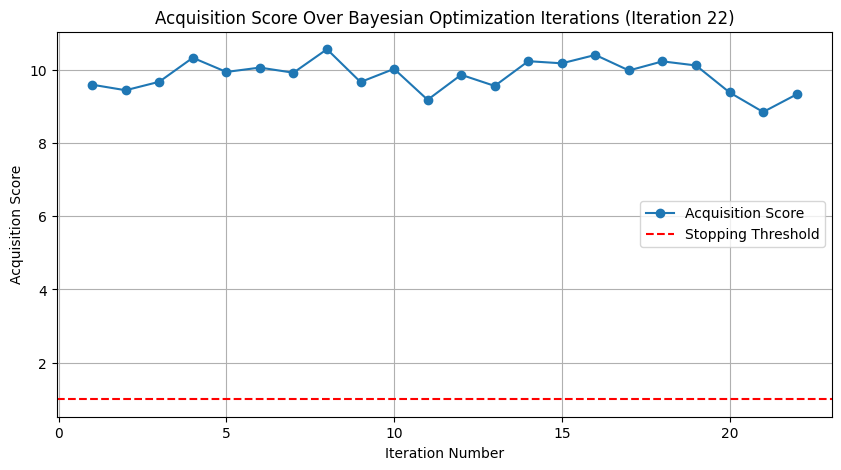

Starting Bayesian Optimization Iteration 23...


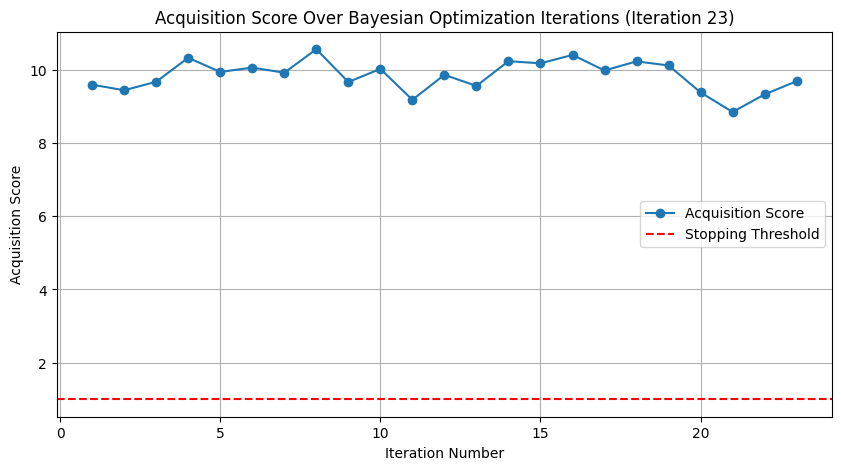

Starting Bayesian Optimization Iteration 24...


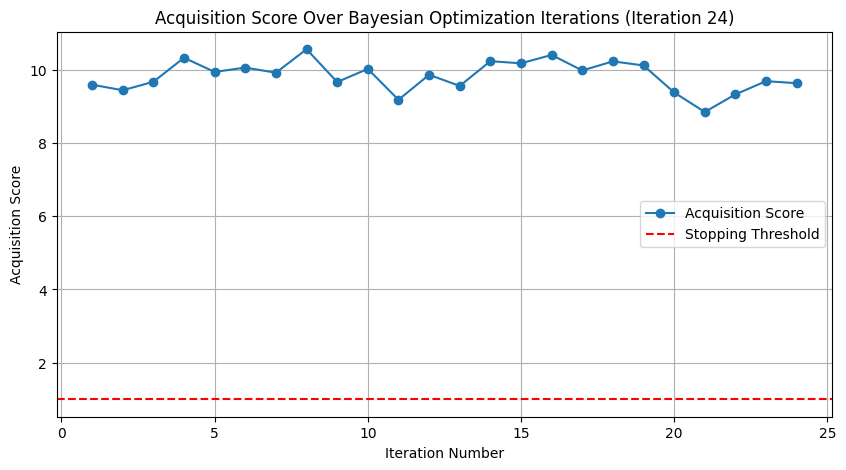

Starting Bayesian Optimization Iteration 25...


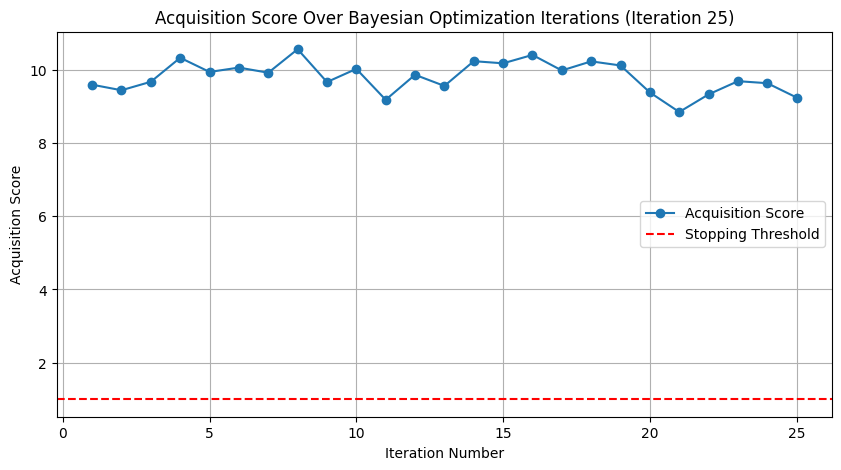

Starting Bayesian Optimization Iteration 26...


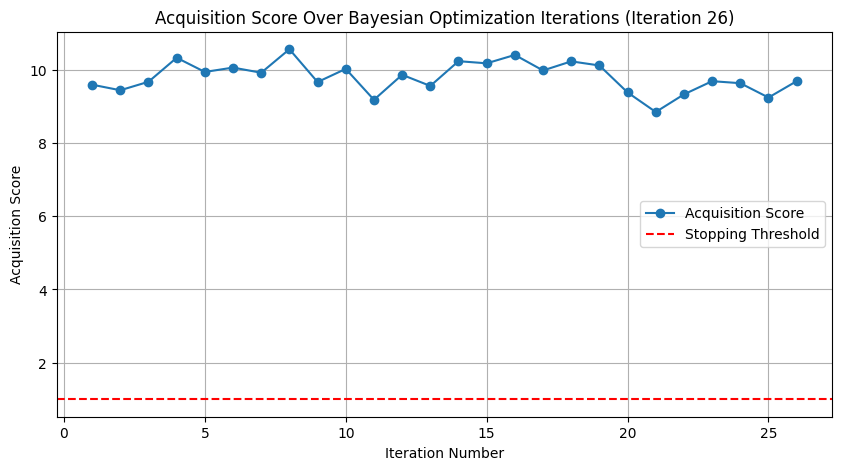

Starting Bayesian Optimization Iteration 27...


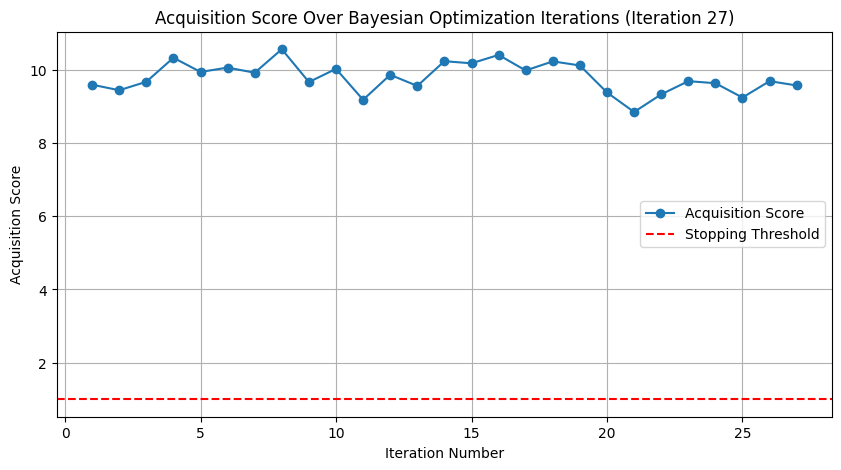

Starting Bayesian Optimization Iteration 28...


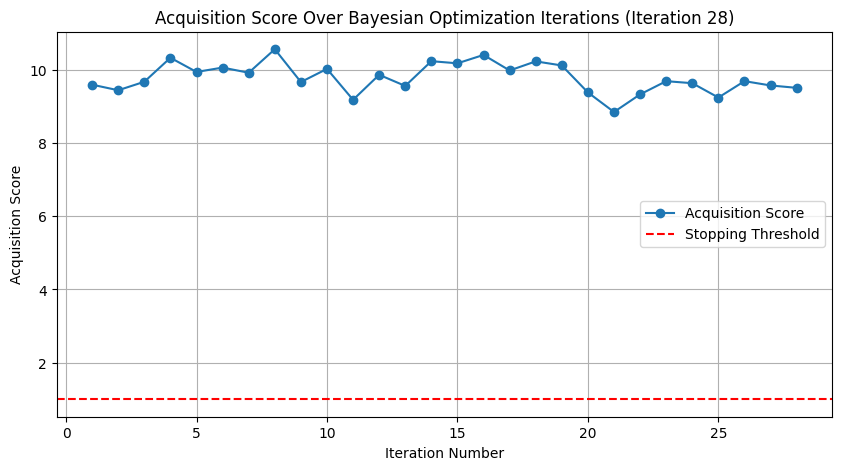

Starting Bayesian Optimization Iteration 29...


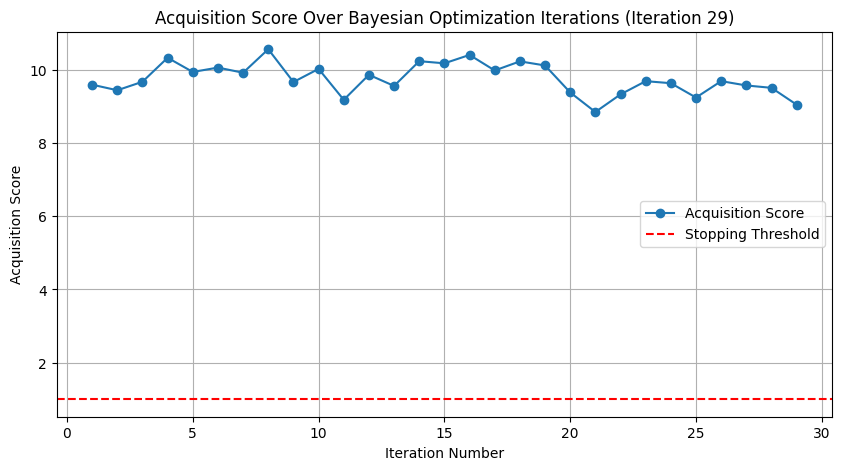

Starting Bayesian Optimization Iteration 30...


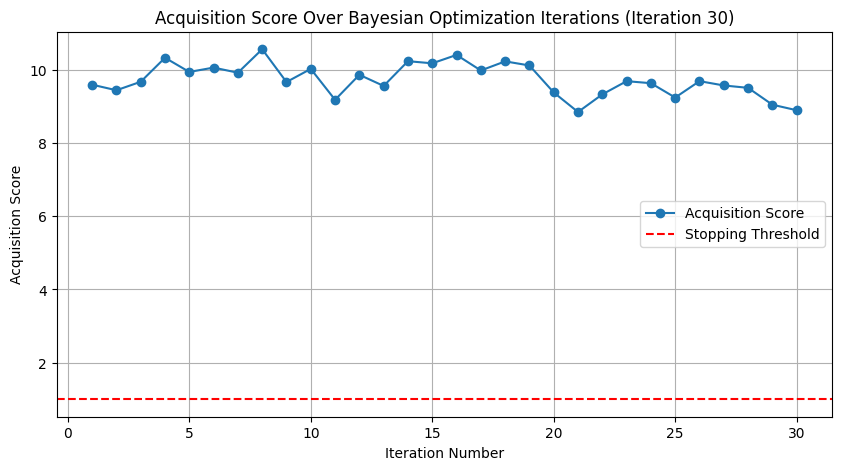

Starting Bayesian Optimization Iteration 31...


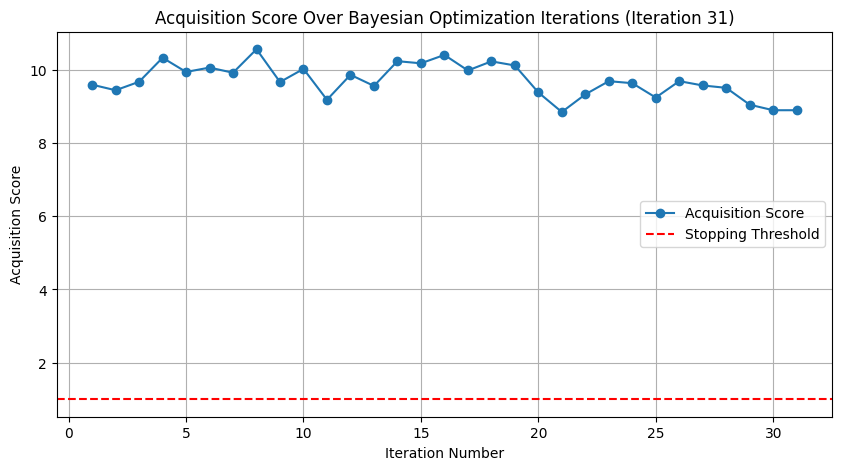

Starting Bayesian Optimization Iteration 32...


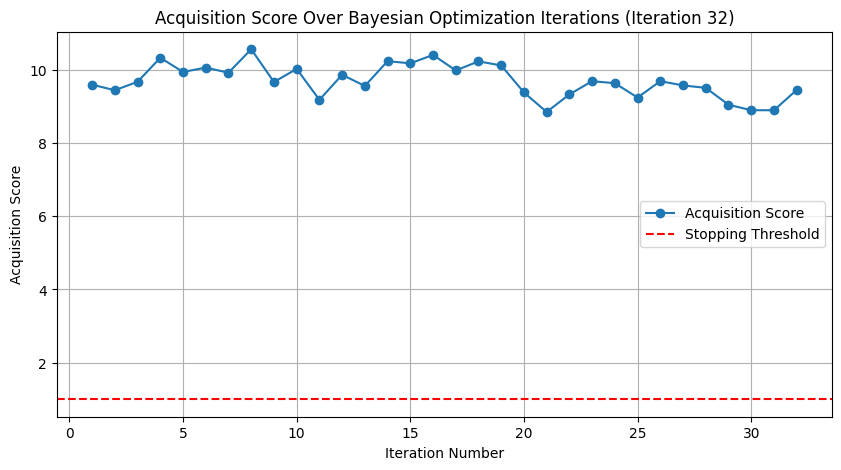

Starting Bayesian Optimization Iteration 33...


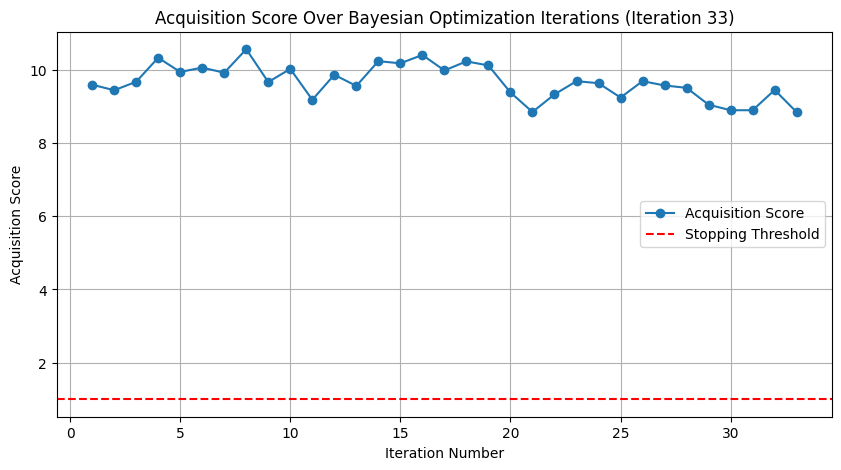

Starting Bayesian Optimization Iteration 34...


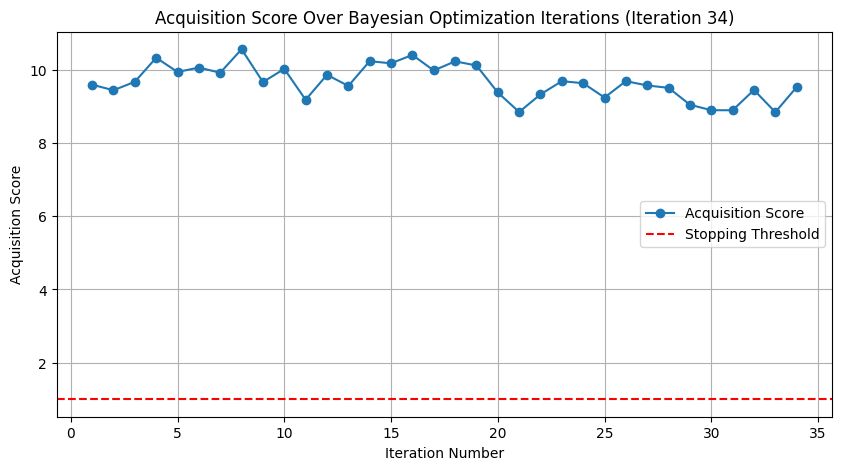

Starting Bayesian Optimization Iteration 35...


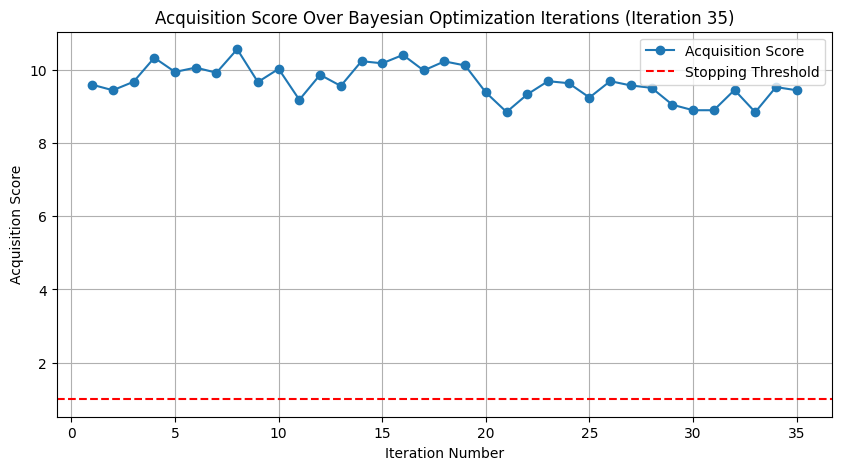

Starting Bayesian Optimization Iteration 36...


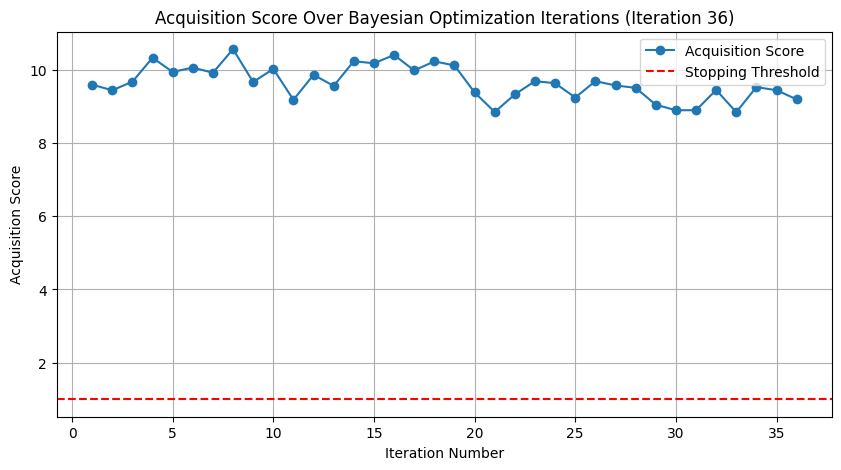

Starting Bayesian Optimization Iteration 37...


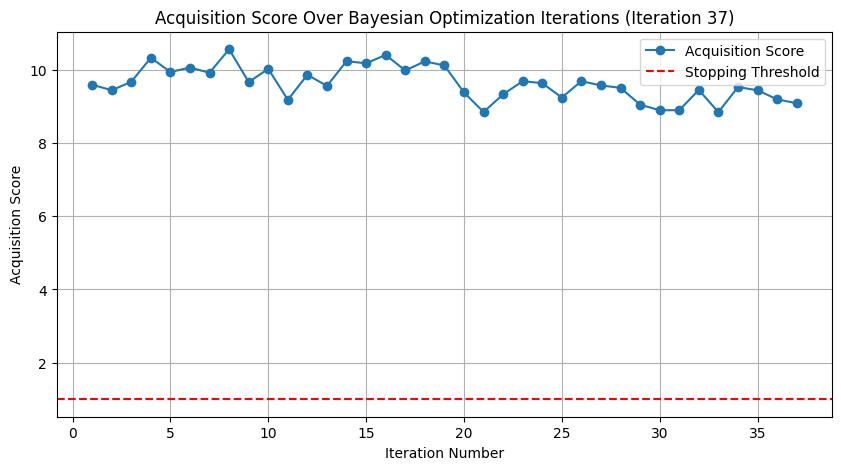

Starting Bayesian Optimization Iteration 38...


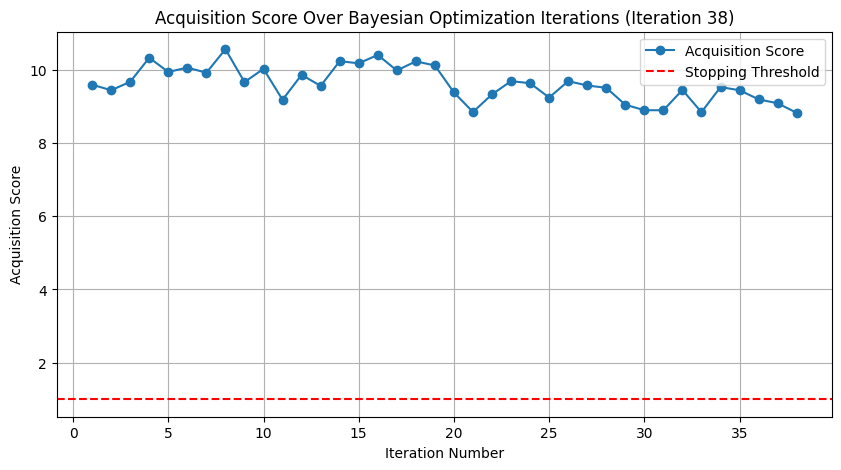

Starting Bayesian Optimization Iteration 39...


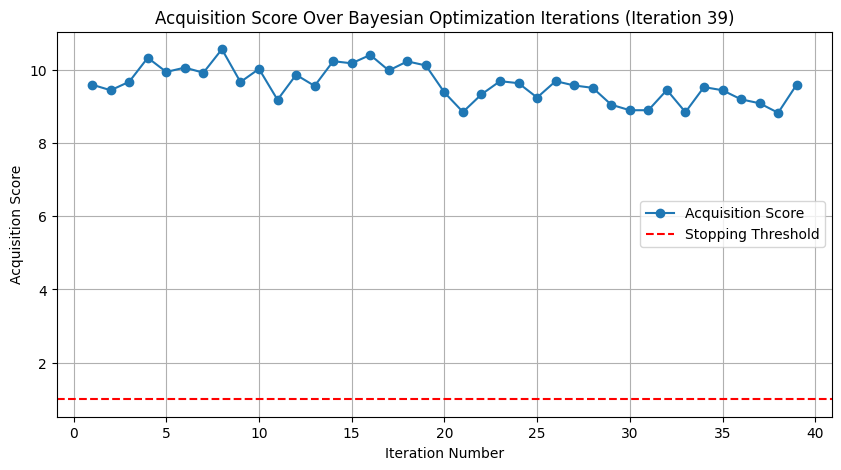

Starting Bayesian Optimization Iteration 40...


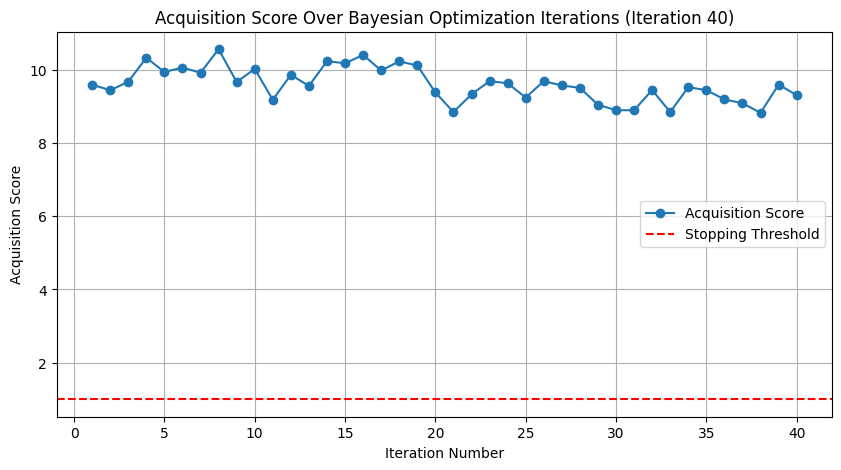

Maximum iterations (40) reached. Stopping BO.


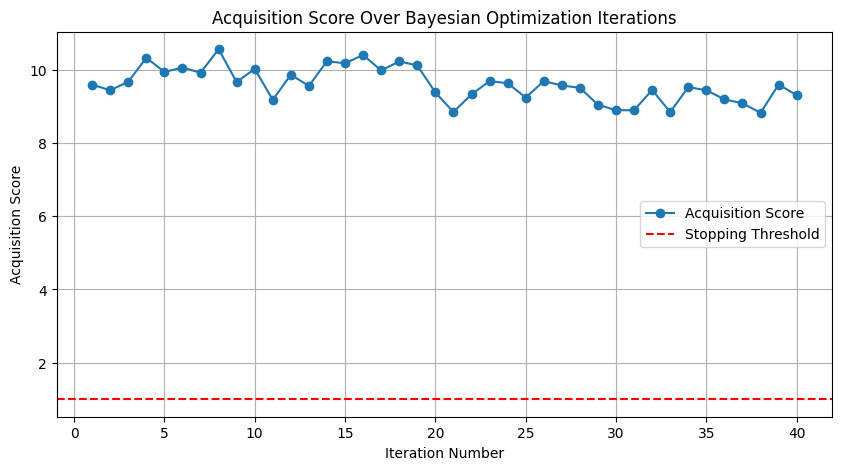

In [18]:
tolerance_threshold = 1  # Threshold for stopping
N_average_tol = 3        # Number of iterations to average for stopping criteria
max_iterations = 40  # Set to None if you want unlimited iterations, it will just keep searching

# Configuration
num_initial_tests = 12  # Number of initial test cases (12 selected given the LHS metrics)

# Define a flag for simulation mode
simulated = True  # Set to False for manual mode. This is used when we have a real experiment

# Define search space
db_memory_values = sorted(configs_no_control["DB_Memory"].unique()) 
mas_workers_values = sorted(configs_no_control["MAS_Workers"].unique())
parallel_jobs_values = sorted(configs_no_control["Parallel_Jobs"].unique())

# Perform Latin Hypercube Sampling (LHS)
sampler = qmc.LatinHypercube(d=3, seed=42) #set seed and amount of features (3)
lhs_samples = sampler.random(num_initial_tests)

# Map LHS samples to discrete configuration values - ensures all observations match config bins given scaling
df_lhs_initial = pd.DataFrame({
    "DB_Memory": [db_memory_values[int(i * len(db_memory_values))] for i in lhs_samples[:, 0]],
    "MAS_Workers": [mas_workers_values[int(i * len(mas_workers_values))] for i in lhs_samples[:, 1]],
    "Parallel_Jobs": [parallel_jobs_values[int(i * len(parallel_jobs_values))] for i in lhs_samples[:, 2]]
})

# Merge with actual configurations
df_lhs_initial = df_lhs_initial.merge(configs_no_control, on=["DB_Memory", "MAS_Workers", "Parallel_Jobs"], how="inner")
df_lhs_initial["Selection_Method"] = "LHS"

# Compute LHS selection metrics
lhs_points = df_lhs_initial[["DB_Memory", "MAS_Workers", "Parallel_Jobs"]].values #extract lhs obs
pairwise_distances = pdist(lhs_points, metric='euclidean') #measure distance using euc

#Derive metrics - shows 12 needed in lhs
lhs_metrics = {
    "Mean Pairwise Distance": np.mean(pairwise_distances),
    "Coverage Score": {
        "DB_Memory": len(df_lhs_initial["DB_Memory"].unique()) / len(db_memory_values),
        "MAS_Workers": len(df_lhs_initial["MAS_Workers"].unique()) / len(mas_workers_values),
        "Parallel_Jobs": len(df_lhs_initial["Parallel_Jobs"].unique()) / len(parallel_jobs_values)
    },
    "Discrepancy Metric": np.var(pairwise_distances)
}
print(lhs_metrics)

#LHS - Manaully input execution time for LHS test cases or Assign execution times based on simulation mode
if simulated:
       df_lhs_initial = df_lhs_initial.merge(
        execution_results[["Configuration", "Execution_Time"]],
        on="Configuration",
        how="left" 
    )
else:
    for index, row in df_lhs_initial.iterrows():
        while True:
            try:
                user_input = float(input(f"Enter execution time for {row['Configuration']}: "))
                df_lhs_initial.at[index, "Execution_Time"] = user_input
                break
            except ValueError:
                print("Invalid input. Please enter a numeric execution time.")

# Reset variables
used_configs = set(df_lhs_initial["Configuration"].unique()) #used to track what has been sampled
df_live_bo = df_lhs_initial.copy() #copies to track what has been used in the past
df_live_bo["Acquisition_Score"] = np.nan #starts with nan before assigned
df_available_configs = configs[~configs["Configuration"].isin(used_configs)].copy() #tracks what can be sampled

# BO Tracking Variables - initialises them prior to loop
iteration_numbers = []
acquisition_scores = []
uncertainty_snapshots = []
acquisition_history = []
iteration = 1
bo_selected_cases = []

#BO loop - manual input or synthetic depending on the real or fake experiment
while True:
    print(f"Starting Bayesian Optimization Iteration {iteration}...")

    # Update available configurations
    df_available_configs = configs[~configs["Configuration"].isin(used_configs)].copy()
    
    if df_available_configs.empty:
        print("No more unique configurations left. Stopping BO.")
        break  

    # Train Model
    X_train = df_live_bo[["DB_Memory", "MAS_Workers", "Parallel_Jobs"]].values
    y_train = df_live_bo["Execution_Time"].values
    scaler = MinMaxScaler()
    X_train_scaled = scaler.fit_transform(X_train)
    
    rf = RandomForestRegressor(n_estimators=100, random_state=42) #Rf regressor used for discrete FS
    rf.fit(X_train_scaled, y_train)

    # Estimate Uncertainty to explore feature space
    X_available_scaled = scaler.transform(df_available_configs[["DB_Memory", "MAS_Workers", "Parallel_Jobs"]].values)
    mean_prediction, std_prediction = estimate_uncertainty(rf, X_available_scaled)
    uncertainty_snapshots.append((mean_prediction.copy(), std_prediction.copy(), iteration))
    
    # Compute Acquisition Score
    acquisition_score = std_prediction * np.random.rand(len(std_prediction)) #enforces more uncertainty to overcome the discrete FS

    # Select New Test Case
    next_index = np.argmax(acquisition_score) #takes one with highest acq score
    next_test_case = df_available_configs.iloc[next_index].copy()
    used_configs.add(next_test_case["Configuration"]) #adds it to used configs
    df_available_configs = df_available_configs.drop(df_available_configs.index[next_index]) #updates available configs

    # Determine Execution Time: Simulated or Manual
    if simulated:
        # Use synthetic execution time
        next_test_case["Execution_Time"] = execution_results.loc[
            execution_results["Configuration"] == next_test_case["Configuration"], "Execution_Time"
        ].values[0]
    else:
        # Request manual input for execution time
        while True:
            try:
                user_input = float(input(f"Enter execution time for {next_test_case['Configuration']}: "))
                next_test_case["Execution_Time"] = user_input
                break
            except ValueError:
                print("Invalid input. Please enter a numeric execution time.")

    # Assign BO Metadata
    next_test_case["Selection_Method"] = "BO"
    next_test_case["Acquisition_Score"] = acquisition_score[next_index]

    # Store results
    bo_selected_cases.append(next_test_case)
    iteration_numbers.append(iteration)
    acquisition_scores.append(acquisition_score[next_index])
    acquisition_history.append(acquisition_score[next_index])

    # Display progress plot after each iteration
    plt.figure(figsize=(10, 5))
    plt.plot(iteration_numbers, acquisition_scores, marker='o', linestyle='-', label="Acquisition Score")
    plt.axhline(y=tolerance_threshold, color='r', linestyle='--', label="Stopping Threshold")
    plt.xlabel("Iteration Number")
    plt.ylabel("Acquisition Score")
    plt.title(f"Acquisition Score Over Bayesian Optimization Iterations (Iteration {iteration})")
    plt.legend()
    plt.grid(True)
    plt.show()
    
    # Check stopping criteria: tolerance-based
    if len(acquisition_history) >= N_average_tol and np.mean(acquisition_history[-N_average_tol:]) < tolerance_threshold:
        print(f"Stopping criteria met at iteration {iteration}. Ending BO process.")
        break
    
    # Check stopping criteria: maximum iteration cap
    if max_iterations is not None and iteration >= max_iterations:
        print(f"Maximum iterations ({max_iterations}) reached. Stopping BO.")
        break

    iteration += 1

# Convert BO Cases into DataFrame
df_bo_cases = pd.DataFrame(bo_selected_cases)

# Merge LHS and BO results
df_live_bo = pd.concat([df_live_bo, df_bo_cases], ignore_index=True)

# Plot Acquisition Scores
plt.figure(figsize=(10, 5))
plt.plot(iteration_numbers, acquisition_scores, marker='o', linestyle='-', label="Acquisition Score")
plt.axhline(y=tolerance_threshold, color='r', linestyle='--', label="Stopping Threshold")
plt.xlabel("Iteration Number")
plt.ylabel("Acquisition Score")
plt.title("Acquisition Score Over Bayesian Optimization Iterations")
plt.legend()
plt.grid(True)
plt.savefig(r"C:\Users\benja\Documents\MSC BAM\THESIS\Gitrepo\Images\Feature_space_sampling.png") #Change by user
plt.show()


#### GENERATE PLOT ACROSS BO PROCESS TO SHOW LEARNING

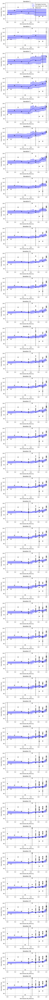

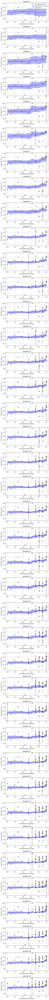

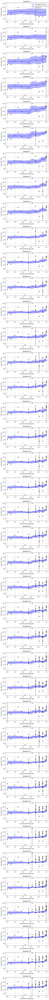

In [20]:
def plot_bo_learning_over_iterations(
    feature_idx,
    feature_name,
    scaler,
    base_config,
    df_live_bo,
    df_bo_cases,
    num_initial_tests,
    uncertainty_snapshots,
    true_func=None,
    max_plots=5
):
    """
    Plot how Bayesian Optimization learns a 1D feature over multiple iterations.
    """
    n_plots = min(max_plots, len(uncertainty_snapshots))
    fig = plt.figure(figsize=(6, 3 * n_plots))
    gs = gridspec.GridSpec(n_plots, 1)

    sweep_range = np.linspace(0, 1, 100).reshape(-1, 1)

    for i in range(n_plots):
        _, _, iter_num = uncertainty_snapshots[i]

        subset = df_live_bo.iloc[:num_initial_tests + i]
        X_train = subset[["DB_Memory", "MAS_Workers", "Parallel_Jobs"]].values
        y_train = subset["Execution_Time"].values
        X_train_scaled = scaler.transform(X_train)

        rf_model = RandomForestRegressor(n_estimators=100, random_state=42)
        rf_model.fit(X_train_scaled, y_train)

        X_sweep = np.tile(base_config, (100, 1))
        X_sweep[:, feature_idx] = sweep_range[:, 0]
        mean_pred, std_pred = estimate_uncertainty(rf_model, X_sweep)

        # Next BO point (scaled)
        next_sample_scaled = scaler.transform(
            df_bo_cases[["DB_Memory", "MAS_Workers", "Parallel_Jobs"]].values[i].reshape(1, -1)
        )[0]

        ax = fig.add_subplot(gs[i])
        
        # Plot surrogate
        ax.plot(sweep_range[:, 0], mean_pred, 'b-', label='Surrogate function')
        ax.fill_between(sweep_range[:, 0], mean_pred - std_pred, mean_pred + std_pred,
                        alpha=0.3, color='blue', label='Uncertainty (±1 std)')

        # Plot noisy observations
        X_feature_vals = X_train_scaled[:, feature_idx]
        ax.scatter(X_feature_vals, y_train, color='black', marker='x', s=50, label='Observed')

        # Mark next sample
        ax.axvline(next_sample_scaled[feature_idx], linestyle='--', color='black')

        ax.set_title(f"Iteration {iter_num}")
        ax.set_xlabel(f"Normalized {feature_name}")
        ax.set_ylabel("Execution Time")
        ax.grid(True)
        if i == 0:
            ax.legend(loc='upper right')

    plt.tight_layout()
    plt.savefig(rf"C:\Users\benja\Documents\MSC BAM\THESIS\Gitrepo\Images\BO_Learning_{feature_name}.png") # Change by user
    plt.show()

# Create a base config (e.g., median of training data in scaled space)
X_train = df_live_bo[["DB_Memory", "MAS_Workers", "Parallel_Jobs"]].values
scaler = MinMaxScaler()
X_train_scaled = scaler.fit_transform(X_train)
base_config = np.median(X_train_scaled, axis=0)
last_idx = len(uncertainty_snapshots) - 1

# Use this to plot learning over time for DB_Memory
plot_bo_learning_over_iterations(
    feature_idx=0,
    feature_name="DB_Memory",
    scaler=scaler,
    base_config=base_config,
    df_live_bo=df_live_bo,
    df_bo_cases=df_bo_cases,
    num_initial_tests=num_initial_tests,
    uncertainty_snapshots=uncertainty_snapshots,
    true_func=None, 
    max_plots=df_live_bo.shape[0]  # total number of rows 
)

# Use this to plot learning over time for DB_Memory
plot_bo_learning_over_iterations(
    feature_idx=0,
    feature_name="MAS_Workers",
    scaler=scaler,
    base_config=base_config,
    df_live_bo=df_live_bo,
    df_bo_cases=df_bo_cases,
    num_initial_tests=num_initial_tests,
    uncertainty_snapshots=uncertainty_snapshots,
    true_func=None, 
    max_plots=df_live_bo.shape[0]  # total number of rows
)

# Use this to plot learning over time for DB_Memory
plot_bo_learning_over_iterations(
    feature_idx=0,
    feature_name="Parallel_Jobs",
    scaler=scaler,
    base_config=base_config,
    df_live_bo=df_live_bo,
    df_bo_cases=df_bo_cases,
    num_initial_tests=num_initial_tests,
    uncertainty_snapshots=uncertainty_snapshots,
    true_func=None, 
    max_plots=df_live_bo.shape[0]  # total number of rows
)

#### PLOT UNCERTAINTY ACROSS FEATURE SPACE

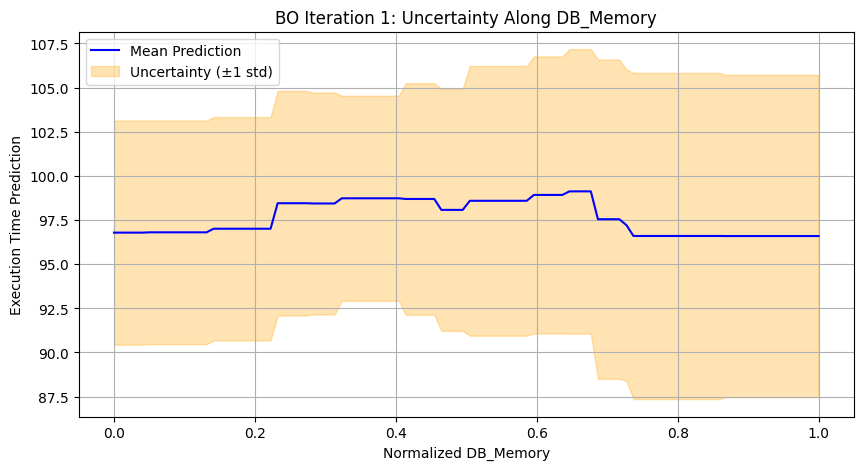

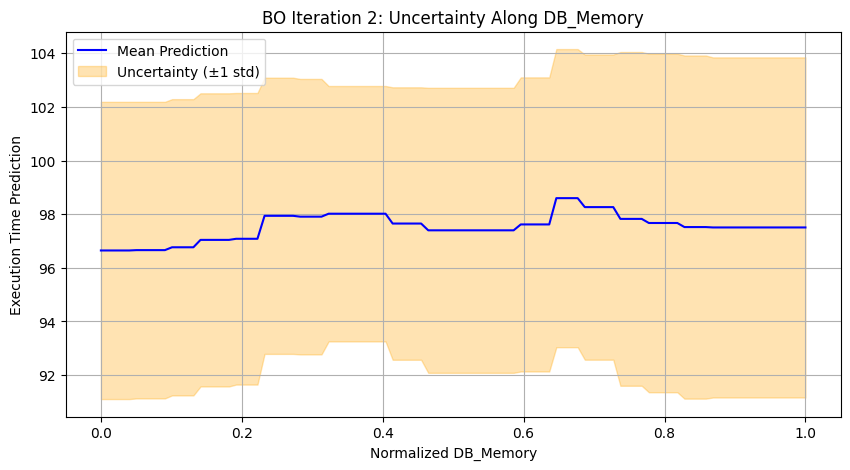

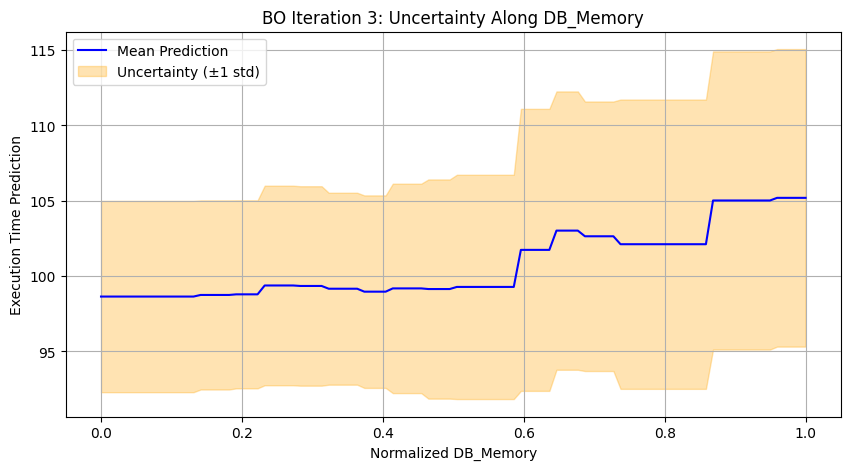

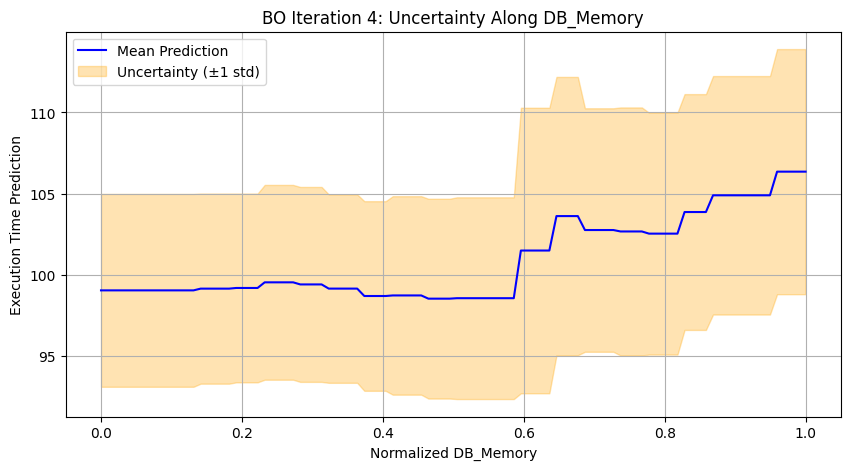

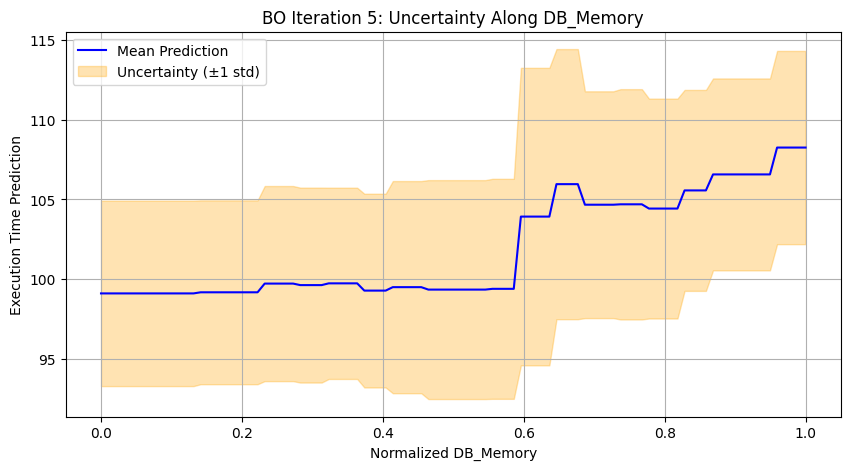

...

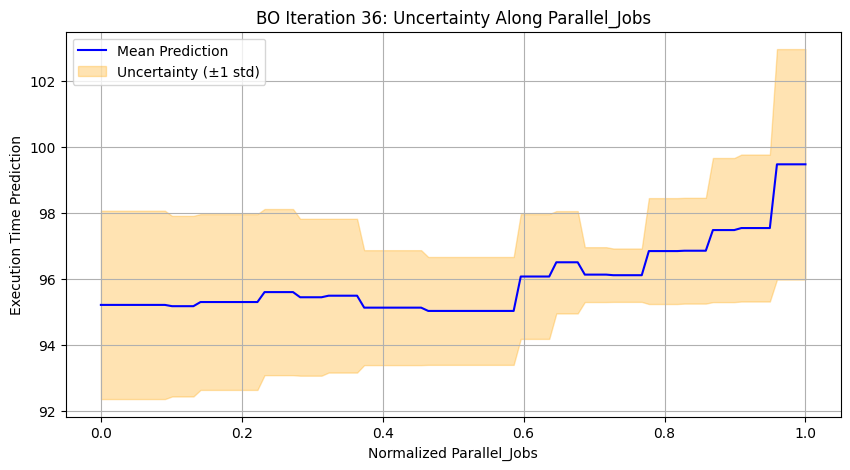

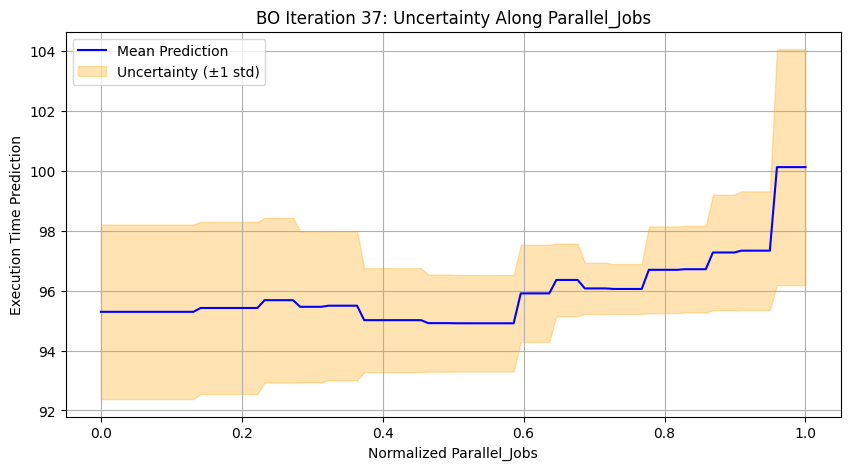

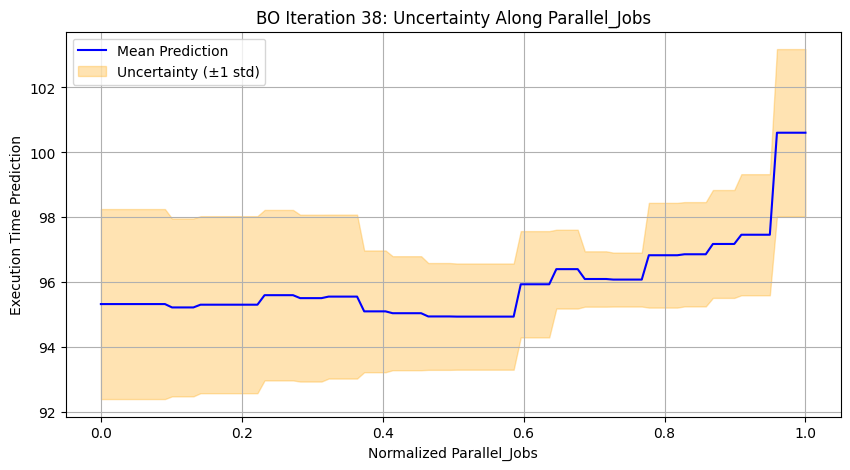

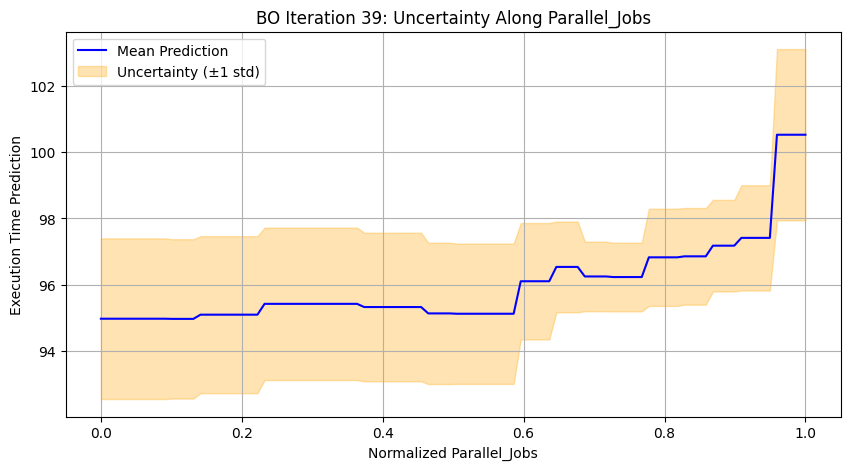

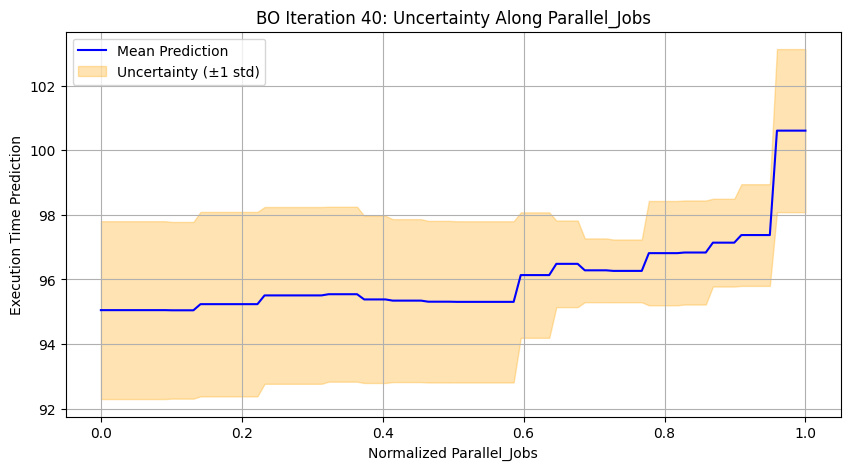

In [22]:
def plot_uncertainty_along_feature(rf_model, scaler, base_config, feature_idx, feature_name, iter_num, save=False):
    """
    Plot uncertainty by varying one feature and fixing the others at base_config.
    """
    # Create a sweep along one dimension
    sweep_range = np.linspace(0, 1, 100)  # normalised space
    X_sweep = np.tile(base_config, (100, 1))
    X_sweep[:, feature_idx] = sweep_range

    # Predict and compute uncertainty
    mean_pred, std_pred = estimate_uncertainty(rf_model, X_sweep) #BO model process

    # Plot graph
    plt.figure(figsize=(10, 5))
    plt.plot(sweep_range, mean_pred, color='blue', label="Mean Prediction")
    plt.fill_between(sweep_range,
                     mean_pred - std_pred,
                     mean_pred + std_pred,
                     alpha=0.3, color='orange', label='Uncertainty (±1 std)')
    plt.title(f"BO Iteration {iter_num}: Uncertainty Along {feature_name}")
    plt.xlabel(f"Normalized {feature_name}")
    plt.ylabel("Execution Time Prediction")
    plt.legend()
    plt.grid(True)
    if save:
        plt.savefig(rf"C:\Users\benja\Documents\MSC BAM\THESIS\Gitrepo\Images\uncertainty_plot_iter_{iter_num}_{feature_name}.png") #Change by user
    plt.show()

# For DB, call function for the specific dimension being models
for i, (_, _, iter_num) in enumerate(uncertainty_snapshots):
    rf_model = RandomForestRegressor(n_estimators=100, random_state=42) #Use rf for predictions
    rf_model.fit(X_train_scaled[:num_initial_tests + i], df_live_bo["Execution_Time"].values[:num_initial_tests + i])

    plot_uncertainty_along_feature(
        rf_model, scaler, base_config,
        feature_idx=0, feature_name="DB_Memory", iter_num=iter_num,
        save=(i == last_idx)
    )

# For mas workers
for i, (_, _, iter_num) in enumerate(uncertainty_snapshots):
    rf_model = RandomForestRegressor(n_estimators=100, random_state=42)
    rf_model.fit(X_train_scaled[:num_initial_tests + i], df_live_bo["Execution_Time"].values[:num_initial_tests + i])

    plot_uncertainty_along_feature(
        rf_model, scaler, base_config,
        feature_idx=0, feature_name="MAS_Workers", iter_num=iter_num,
        save=(i == last_idx)
    )
# For para computations
for i, (_, _, iter_num) in enumerate(uncertainty_snapshots):
    rf_model = RandomForestRegressor(n_estimators=100, random_state=42)
    rf_model.fit(X_train_scaled[:num_initial_tests + i], df_live_bo["Execution_Time"].values[:num_initial_tests + i])

    plot_uncertainty_along_feature(
        rf_model, scaler, base_config,
        feature_idx=0, feature_name="Parallel_Jobs", iter_num=iter_num,
        save=(i == last_idx)
    )

### Summarise the covered feature space

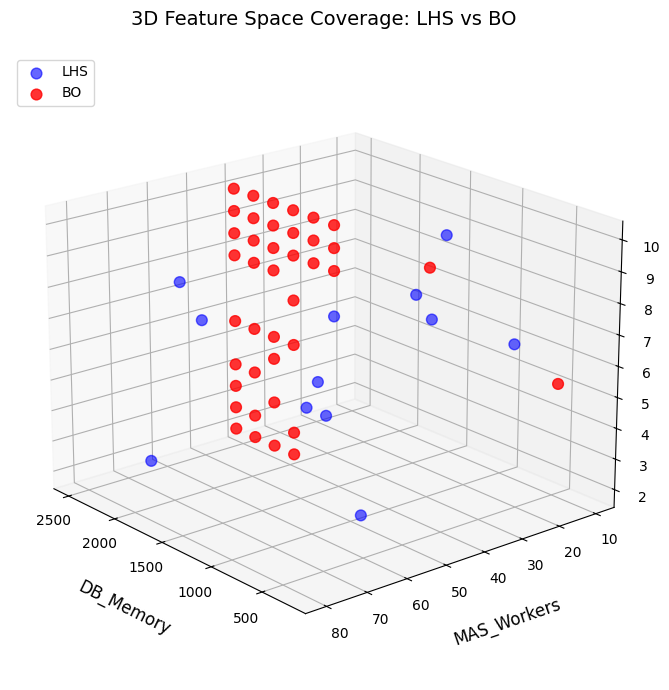

In [24]:
# Create a larger figure to avoid layout cropping
fig = plt.figure(figsize=(10, 7))  
ax = fig.add_subplot(111, projection='3d') #3 dimensions

# Plot LHS obs in graph
lhs_data = df_live_bo[df_live_bo["Selection_Method"] == "LHS"]
ax.scatter(lhs_data["DB_Memory"], lhs_data["MAS_Workers"], lhs_data["Parallel_Jobs"], 
           c='blue', label="LHS", alpha=0.6, s=60)

# Plot BO obs in graph
bo_data = df_live_bo[df_live_bo["Selection_Method"] == "BO"]
ax.scatter(bo_data["DB_Memory"], bo_data["MAS_Workers"], bo_data["Parallel_Jobs"], 
           c='red', label="BO", alpha=0.8, s=60)

# Ensure axis labels are clearly visible (spacing etc)
ax.set_xlabel("DB_Memory", fontsize=12, labelpad=15)
ax.set_ylabel("MAS_Workers", fontsize=12, labelpad=15)
ax.set_zlabel("Parallel_Jobs", fontsize=12, labelpad=15)

# Adjust axis tick labels
ax.tick_params(axis='x', labelsize=10)
ax.tick_params(axis='y', labelsize=10)
ax.tick_params(axis='z', labelsize=10)

# Improve the 3D viewing angle 
ax.view_init(elev=20, azim=140)  # This prevents axis being off the page....

# Add title
ax.set_title("3D Feature Space Coverage: LHS vs BO", fontsize=14, pad=20)

# Ensure all elements fit properly - again more spacing...
plt.tight_layout()

# Add legend
ax.legend(fontsize=10, loc="upper left")

# Show plot
plt.savefig(r"C:\Users\benja\Documents\MSC BAM\THESIS\Gitrepo\Images\Sample_space_lhs_vs_bo",dpi=300) # Change by user
plt.show()


### More feature space summary

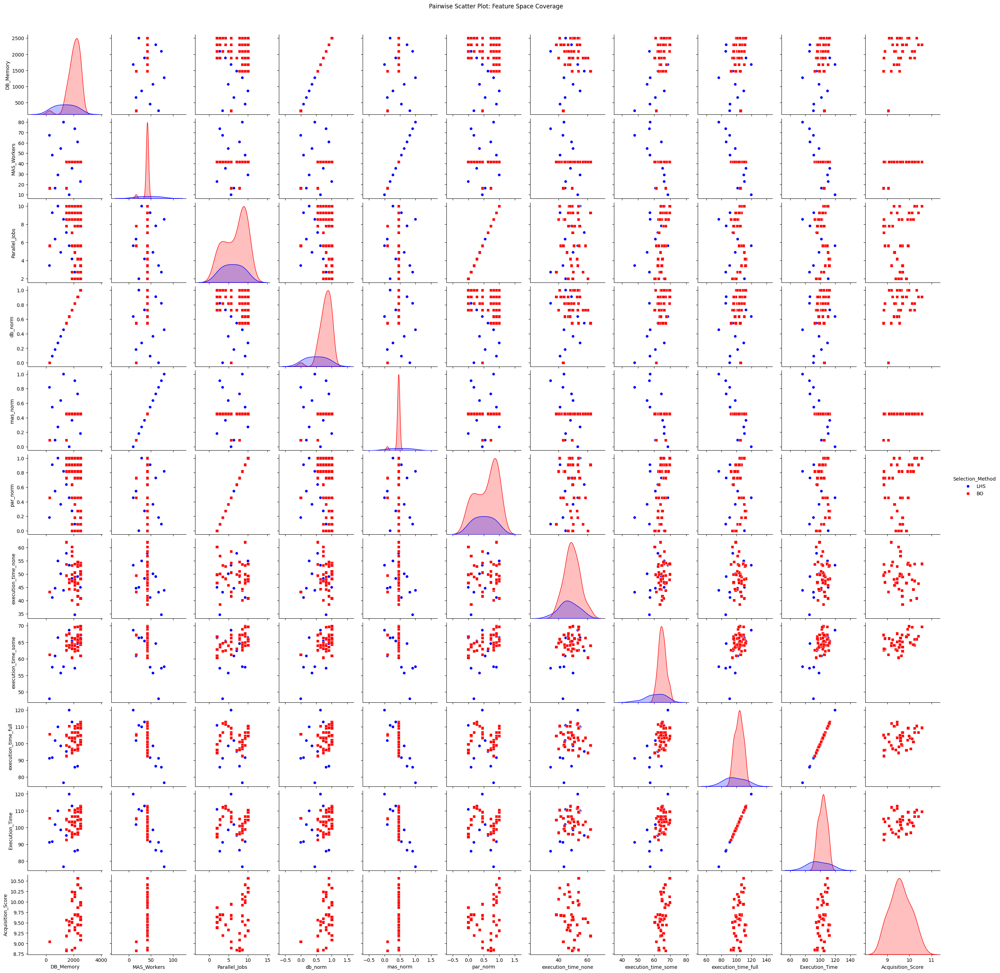

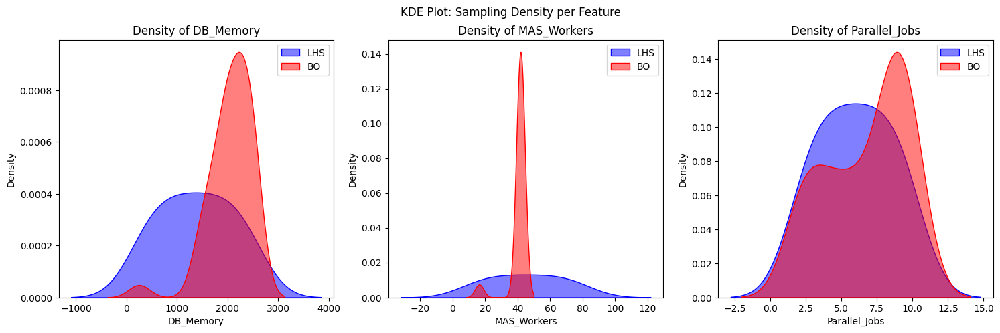

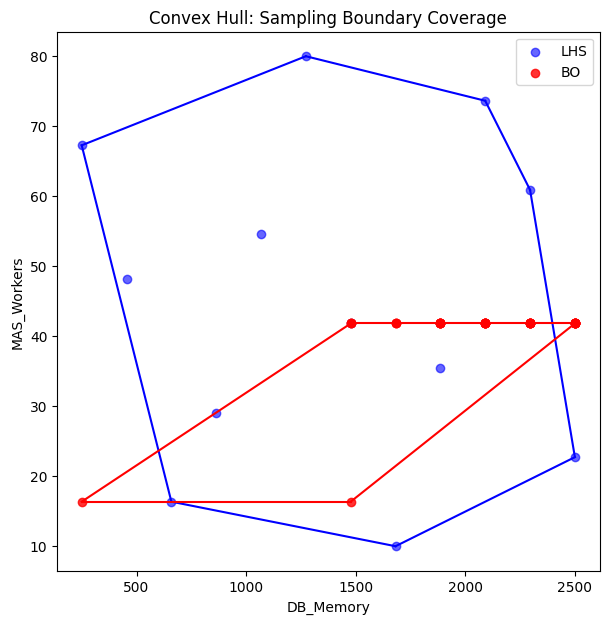

Feature Space Coverage using convex hull: 52.38%


In [26]:
# Copy dataset to ensure clean display without corrupting the data
df = df_live_bo

# Define colors for LHS and BO
colors = {"LHS": "blue", "BO": "red"}

# Pairwise Scatter Plot Matrix 
sns.pairplot(df, hue="Selection_Method", palette=colors, markers=["o", "s"])
plt.suptitle("Pairwise Scatter Plot: Feature Space Coverage", y=1.02)
plt.show()

# Kernel Density Estimation Plot - shows density of sampled points
fig, axes = plt.subplots(1, 3, figsize=(18, 5))
features = ["DB_Memory", "MAS_Workers", "Parallel_Jobs"]

for i, feature in enumerate(features):
    sns.kdeplot(df[df["Selection_Method"] == "LHS"][feature], label="LHS", color="blue", fill=True, alpha=0.5, ax=axes[i])
    sns.kdeplot(df[df["Selection_Method"] == "BO"][feature], label="BO", color="red", fill=True, alpha=0.5, ax=axes[i])
    axes[i].set_title(f"Density of {feature}")
    axes[i].legend()

plt.suptitle("KDE Plot: Sampling Density per Feature")
plt.savefig(r"C:\Users\benja\Documents\MSC BAM\THESIS\Gitrepo\Images\Coverage_sampling.png") # Change by user
plt.show()

# Convex Hull
fig = plt.figure(figsize=(7, 7))
ax = fig.add_subplot(111)

# Extract 2D projection (DB_Memory vs MAS_Workers)
lhs_points = df[df["Selection_Method"] == "LHS"][["DB_Memory", "MAS_Workers"]].values
bo_points = df[df["Selection_Method"] == "BO"][["DB_Memory", "MAS_Workers"]].values

# Plot original points
ax.scatter(lhs_points[:, 0], lhs_points[:, 1], c="blue", label="LHS", alpha=0.6)
ax.scatter(bo_points[:, 0], bo_points[:, 1], c="red", label="BO", alpha=0.8)

# Compute and plot convex hull for LHS
if len(lhs_points) > 2:
    hull = ConvexHull(lhs_points)
    for simplex in hull.simplices:
        ax.plot(lhs_points[simplex, 0], lhs_points[simplex, 1], "b-")

# Compute and plot convex hull for BO
if len(bo_points) > 2:
    hull = ConvexHull(bo_points)
    for simplex in hull.simplices:
        ax.plot(bo_points[simplex, 0], bo_points[simplex, 1], "r-")

ax.set_xlabel("DB_Memory")
ax.set_ylabel("MAS_Workers")
ax.set_title("Convex Hull: Sampling Boundary Coverage")
ax.legend()
plt.savefig(r"C:\Users\benja\Documents\MSC BAM\THESIS\Gitrepo\Images\Convex_Hull.png") # Change by user
plt.show()

#Get percentage of FS covered
# Get all unique levels per feature
levels_per_feature = {
    'DB_Memory': df['DB_Memory'].unique(),
    'MAS_Workers': df['MAS_Workers'].unique(),
    'Parallel_Jobs': df['Parallel_Jobs'].unique()
}

# Compute total number of possible combinations
total_possible_combinations = len(list(product(*levels_per_feature.values())))

# Get number of unique sampled combinations
sampled_combinations = df[['DB_Memory', 'MAS_Workers', 'Parallel_Jobs']].drop_duplicates()
unique_sampled_combinations = sampled_combinations.shape[0]

# Calculate % feature space covered
scaler = MinMaxScaler()
sampled_scaled = scaler.fit_transform(df[["DB_Memory", "MAS_Workers","Parallel_Jobs"]])
hull = ConvexHull(sampled_scaled)
coverage = hull.volume * 100  # scaled total space volume is 1.0

print(f"Feature Space Coverage using convex hull: {coverage:.2f}%")

### Further feature space - area coverage

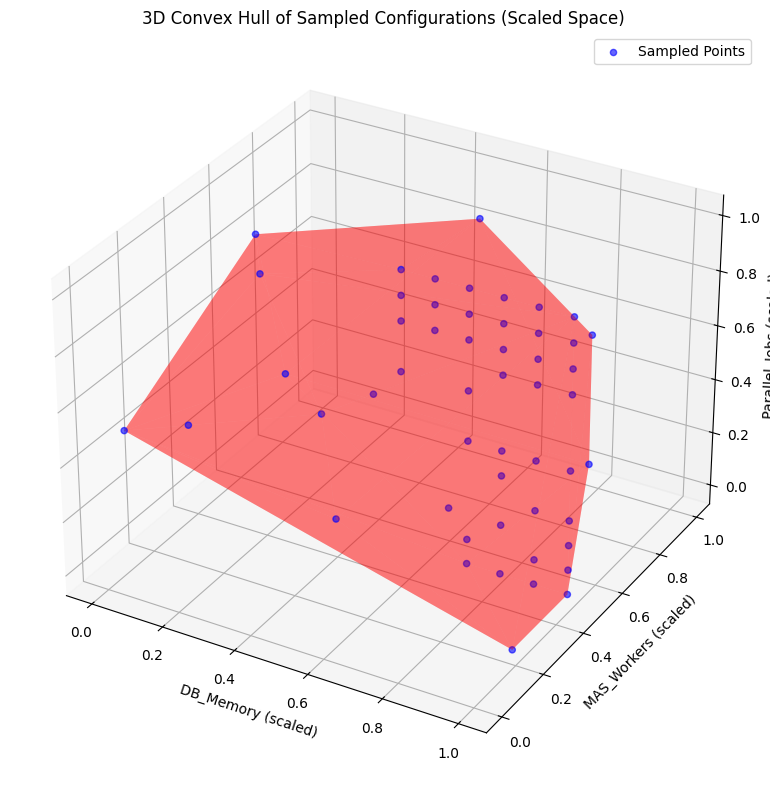

In [28]:
#Display convex hull to represent feature coverage area
# Features to analyze
features = ["DB_Memory", "MAS_Workers", "Parallel_Jobs"]

# Scale the sampled data to [0, 1] space
scaler = MinMaxScaler()
sampled_scaled = scaler.fit_transform(df[features].values)

# Compute Convex Hull
hull = ConvexHull(sampled_scaled)

# Plot in 3D
fig = plt.figure(figsize=(8, 8))
ax = fig.add_subplot(111, projection="3d")

# Plot sampled points
ax.scatter(sampled_scaled[:, 0], sampled_scaled[:, 1], sampled_scaled[:, 2], color="blue", alpha=0.6, label="Sampled Points")

# Plot convex hull as transparent surface
for simplex in hull.simplices:
    triangle = sampled_scaled[simplex]
    poly = Poly3DCollection([triangle], alpha=0.3, facecolor='red')
    ax.add_collection3d(poly)

# Plot cube edges for [0, 1]^3 reference box - essentially finds the outter boundaries of the cube (8 of them and then plots a surface on them)
r = [0, 1]
for s, e in zip(np.array([[x, y, z] for x in r for y in r for z in r]),
                np.array([[x, y, z] for x in r for y in r for z in r])):
    if np.sum(np.abs(s - e)) == r[1] - r[0]:
        ax.plot3D(*zip(s, e), color="black", linestyle="dashed")

# Axes labels
ax.set_xlabel("DB_Memory (scaled)")
ax.set_ylabel("MAS_Workers (scaled)")
ax.set_zlabel("Parallel_Jobs (scaled)")
ax.set_title("3D Convex Hull of Sampled Configurations (Scaled Space)")
ax.legend()
plt.tight_layout()
plt.savefig(r"C:\Users\benja\Documents\MSC BAM\THESIS\Gitrepo\Images\3D_ConvexHull_Coverage.png") # Change by user
plt.show()


### Phase 2 - Data analysis and modeling

#### GENERATE 1,000 ROWS PER SELECTED CONFIG

In [31]:
#Define a secondary normalise function for this purpose
def normalize(val, min_val, max_val):
    return (val - min_val) / (max_val - min_val)

#Now we redefine the generate observations func such that it generates not just one obs for each config with a relationship, but 1,000
def generate_observations(df_configs, mode="full", n_obs_per_config=1000, noise_std=2.0):
    all_rows = []

    for _, row in df_configs.iterrows():
        # Normalize treatment variables
        db_norm = normalize(row["DB_Memory"], 250, 2500)
        mas_norm = normalize(row["MAS_Workers"], 10, 80)
        par_norm = normalize(row["Parallel_Jobs"], 2, 10)

        # Generate synthetic execution time
        if mode == "none":
            exec_times = np.random.normal(loc=50, scale=noise_std, size=n_obs_per_config)

        elif mode == "some":
            exec_times = (
                60
                - 10 * mas_norm
                + 5 * par_norm
                + 8 * db_norm
                + np.random.normal(loc=0, scale=noise_std, size=n_obs_per_config)
            )

        elif mode == "full":
            exec_times = (
                100
                - 25 * mas_norm
                + 15 * db_norm
                + 10 * par_norm
                - 20 * mas_norm * db_norm
                + 10 * np.sin(2 * np.pi * par_norm)
                + 5 * db_norm ** 2
                + 7 * mas_norm * par_norm
                + np.random.normal(loc=0, scale=noise_std, size=n_obs_per_config)
            )

        else:
            raise ValueError("Mode must be one of: 'none', 'some', 'full'")

        # Repeat the entire row (excluding execution time) and add synthetic times
        repeated_data = pd.DataFrame([row.to_dict()] * n_obs_per_config)
        repeated_data["Execution_Time"] = exec_times

        all_rows.append(repeated_data)

    # Combine all results into one DataFrame
    full_df = pd.concat(all_rows, ignore_index=True)
    return full_df

# Add control config back into final DataFrame as it was excluded before
df_control = configs[configs["Configuration"] == control_config_id].copy()
df_live_bo_with_control = pd.concat([df_live_bo, df_control], ignore_index=True)

# mode can be "none", "some", or "full", comment in or out your mode
df = generate_observations(df_live_bo_with_control, mode="full")
# df = generate_observations(df_live_bo_with_control, mode="some")
# df = generate_observations(df_live_bo_with_control, mode="none")

#Make copy for TLFFNN - stops cross contamination if changes are made to the df
df_tlffnn = df.copy()

#### SUMMARISE DATA

In [33]:
#Summarise with skimpy
skim(df)

#Create report
profile = ProfileReport(df, title="Synthetic_data Profiling Report", explorative=True)

# Save the report as an HTML file
profile.to_file("Data_profile_report.html")

#Use sweetviz for more summary reports
report = sv.analyze(df)
report.show_html("Data_sweetviz_report.html")

# Generate a descriptive statistics summary
summary = df.describe().transpose()

# Round for better readability
summary = summary.round(2)

# Rename columns for clarity
summary.index.name = 'Feature'
summary.columns = ['Count', 'Mean', 'Std Dev', 'Min', '25%', 'Median', '75%', 'Max']

# Export to LaTeX
summary.to_latex(
    r"C:\Users\benja\Documents\MSC BAM\THESIS\Gitrepo\Images\data_summary.tex",
    caption="Descriptive Statistics of Sampled Features",
    label="tab:data_summary"
)
summary

#Outlier analysis using Z scores
Numeric_cols = ["DB_Memory","MAS_Workers","Parallel_Jobs","Execution_Time"]

for col in Numeric_cols:
    z_scores = np.abs(stats.zscore(df[col]))
    outliers = df[z_scores > 3]
    print(outliers)

╭──────────────────────────────────────────────── skimpy summary ─────────────────────────────────────────────────╮
│          Data Summary                Data Types                                                                 │
│ ┏━━━━━━━━━━━━━━━━━━━┳━━━━━━━━┓ ┏━━━━━━━━━━━━━┳━━━━━━━┓                                                          │
│ ┃ Dataframe         ┃ Values ┃ ┃ Column Type ┃ Count ┃                                                          │
│ ┡━━━━━━━━━━━━━━━━━━━╇━━━━━━━━┩ ┡━━━━━━━━━━━━━╇━━━━━━━┩                                                          │
│ │ Number of rows    │ 53000  │ │ float64     │ 11    │                                                          │
│ │ Number of columns │ 15     │ │ string      │ 4     │                                                          │
│ └───────────────────┴────────┘ └─────────────┴───────┘                                                          │
│                                                     number                                                      │
│ ┏━━━━━━━━━━━━━━┳━━━━━━━┳━━━━━━━━━━━━━━━┳━━━━━━━━┳━━━━━━━━┳━━━━━━━┳━━━━━━━━┳━━━━━━━━┳━━━━━━━━┳━━━━━━━┳━━━━━━━━┓  │
│ ┃ column       ┃ NA    ┃ NA %          ┃ mean   ┃ sd     ┃ p0    ┃ p25    ┃ p50    ┃ p75    ┃ p100  ┃ hist   ┃  │
│ ┡━━━━━━━━━━━━━━╇━━━━━━━╇━━━━━━━━━━━━━━━╇━━━━━━━━╇━━━━━━━━╇━━━━━━━╇━━━━━━━━╇━━━━━━━━╇━━━━━━━━╇━━━━━━━╇━━━━━━━━┩  │
│ │ DB_Memory    │     0 │             0 │   1871 │  601.1 │   250 │   1682 │   2091 │   2295 │  2500 │ ▁▁▁▃▇▇ │  │
│ │ MAS_Workers  │     0 │             0 │  41.34 │  11.78 │    10 │  41.82 │  41.82 │  41.82 │    80 │  ▁▁▇   │  │
│ │ Parallel_Job │     0 │             0 │  6.528 │  2.731 │     2 │  4.182 │  7.091 │  9.273 │    10 │ ▅▅▅▂▇▇ │  │
│ │ s            │       │               │        │        │       │        │        │        │       │        │  │
│ │ db_norm      │     0 │             0 │ 0.7204 │ 0.2672 │     0 │ 0.6364 │ 0.8182 │ 0.9091 │     1 │ ▁▁▁▃▇▇ │  │
│ │ mas_norm     │     0 │             0 │ 0.4477 │ 0.1683 │     0 │ 0.4545 │ 0.4545 │ 0.4545 │     1 │  ▁▁▇   │  │
│ │ par_norm     │     0 │             0 │  0.566 │ 0.3414 │     0 │ 0.2727 │ 0.6364 │ 0.9091 │     1 │ ▅▅▅▂▇▇ │  │
│ │ execution_ti │     0 │             0 │  48.92 │   5.53 │ 34.63 │  45.01 │     49 │  53.35 │  62.1 │ ▁▃▇▅▅▂ │  │
│ │ me_none      │       │               │        │        │       │        │        │        │       │        │  │
│ │ execution_ti │     0 │             0 │  63.99 │  3.861 │ 47.94 │  62.66 │   64.6 │  66.32 │ 69.87 │   ▂▂▇▅ │  │
│ │ me_some      │       │               │        │        │       │        │        │        │       │        │  │
│ │ execution_ti │     0 │             0 │  102.3 │  7.797 │ 76.57 │  96.97 │  103.4 │  106.6 │ 119.9 │  ▁▅▇▇▁ │  │
│ │ me_full      │       │               │        │        │       │        │        │        │       │        │  │
│ │ Execution_Ti │     0 │             0 │  102.6 │  7.866 │ 72.89 │  97.57 │  103.2 │  108.3 │ 124.7 │  ▁▅▇▅  │  │
│ │ me           │       │               │        │        │       │        │        │        │       │        │  │
│ │ Acquisition_ │ 13000 │ 24.5283018867 │  9.601 │ 0.4593 │ 8.827 │  9.292 │  9.585 │  9.953 │ 10.56 │ ▃▃▇▂▃▂ │  │
│ │ Score        │       │         92452 │        │        │       │        │        │        │       │        │  │
│ └──────────────┴───────┴───────────────┴────────┴────────┴───────┴────────┴────────┴────────┴───────┴────────┘  │
│                                                     string                                                      │
│ ┏━━━━━━━━━━┳━━━━━━┳━━━━━━━━━━┳━━━━━━━━━━┳━━━━━━━━━━━┳━━━━━━━━━━┳━━━━━━━━━━━┳━━━━━━━━━━┳━━━━━━━━━━━┳━━━━━━━━━━┓  │
│ ┃          ┃      ┃          ┃          ┃           ┃          ┃           ┃ chars    ┃ words per ┃ total    ┃  │
│ ┃ column   ┃ NA   ┃ NA %     ┃ shortest ┃ longest   ┃ min      ┃ max       ┃ per row  ┃ row       ┃ words    ┃  │
│ ┡━━━━━━━━━━╇━━━━━━╇━━━━━━━━━━╇━━━━━━━━━━╇━━━━━━━━━━━╇━

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Export report to file:   0%|          | 0/1 [00:00<?, ?it/s]

                                             |          | [  0%]   00:00 -> (? left)

Report Data_sweetviz_report.html was generated! NOTEBOOK/COLAB USERS: the web browser MAY not pop up, regardless, the report IS saved in your notebook/colab files.
Empty DataFrame
Columns: [DB_Memory, MAS_Workers, Parallel_Jobs, Configuration, model_type, request_size, db_norm, mas_norm, par_norm, execution_time_none, execution_time_some, execution_time_full, Selection_Method, Execution_Time, Acquisition_Score]
Index: []
        DB_Memory  MAS_Workers  Parallel_Jobs Configuration model_type  \
8000  1272.727273         80.0       8.545455    Config_862        CPF   
8001  1272.727273         80.0       8.545455    Config_862        CPF   
8002  1272.727273         80.0       8.545455    Config_862        CPF   
8003  1272.727273         80.0       8.545455    Config_862        CPF   
8004  1272.727273         80.0       8.545455    Config_862        CPF   
...           ...          ...            ...           ...        ...   
8995  1272.727273         80.0       8.545455    Config_8

#### Show DAG based on set up

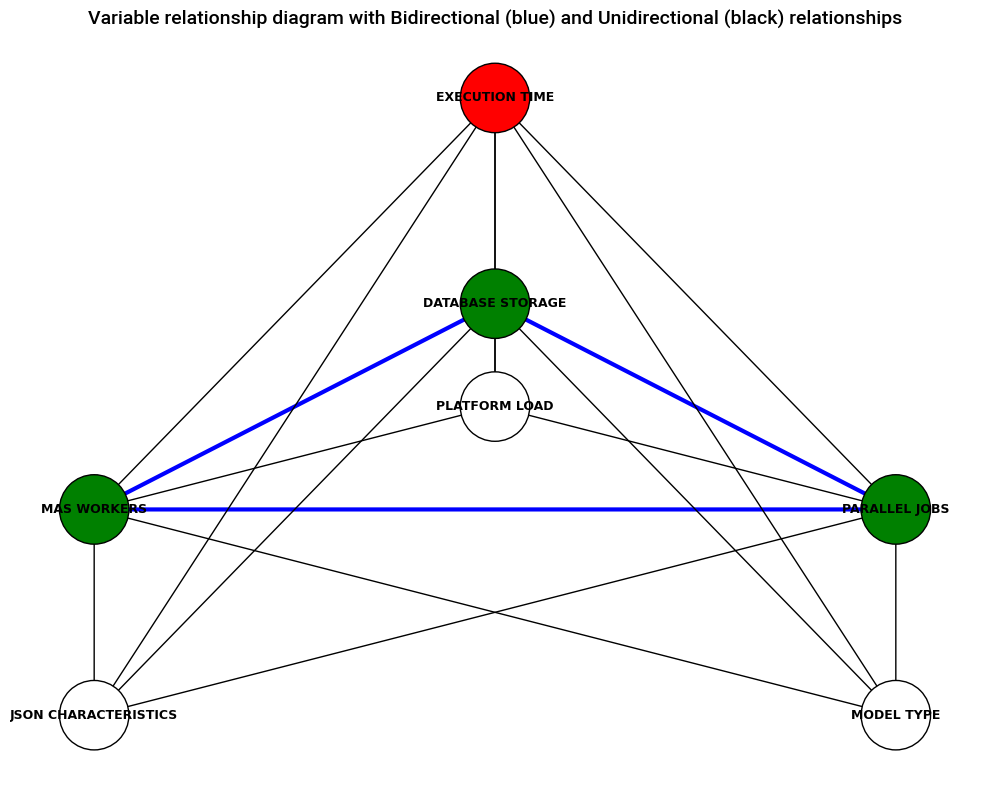

In [35]:
# Define bi directional edges
edges_bidirectional = [
    ('PARALLEL JOBS', 'DATABASE STORAGE'),
    ('MAS WORKERS', 'DATABASE STORAGE'),
    ('MAS WORKERS', 'PARALLEL JOBS')
]

#Define uni directional edges
edges_unidirectional = [
    ('PARALLEL JOBS', 'EXECUTION TIME'),
    ('DATABASE STORAGE', 'EXECUTION TIME'),
    ('MAS WORKERS', 'EXECUTION TIME'),
    ('JSON CHARACTERISTICS', 'EXECUTION TIME'),
    ('JSON CHARACTERISTICS', 'MAS WORKERS'),
    ('JSON CHARACTERISTICS', 'PARALLEL JOBS'),
    ('JSON CHARACTERISTICS', 'DATABASE STORAGE'),
    ('MODEL TYPE', 'EXECUTION TIME'),
    ('MODEL TYPE', 'MAS WORKERS'),
    ('MODEL TYPE', 'PARALLEL JOBS'),
    ('MODEL TYPE', 'DATABASE STORAGE'),
    ('PLATFORM LOAD', 'EXECUTION TIME'),
    ('PLATFORM LOAD', 'MAS WORKERS'),
    ('PLATFORM LOAD', 'PARALLEL JOBS'),
    ('PLATFORM LOAD', 'DATABASE STORAGE')
]

# Create the graph
G = nx.DiGraph()
G.add_edges_from(edges_unidirectional + edges_bidirectional)

# Spacing to make the image look better
pos = {
    'JSON CHARACTERISTICS': (0, 0),
    'MODEL TYPE': (2, 0),
    'MAS WORKERS': (0, 1),
    'PARALLEL JOBS': (2, 1),
    'DATABASE STORAGE': (1, 2),
    'EXECUTION TIME': (1, 3),
    'PLATFORM LOAD': (1, 1.5)
}

# Set node colors for clarity
node_colors = {
    "EXECUTION TIME": "red",
    "JSON CHARACTERISTICS": "white",
    "MODEL TYPE": "white",
    "PLATFORM LOAD": "white"
}
default_color = "green"
node_color_list = [node_colors.get(node, default_color) for node in G.nodes()]

# Draw the plot
fig, ax = plt.subplots(figsize=(10, 8))
nx.draw_networkx_nodes(G, pos, node_color=node_color_list, edgecolors="black", node_size=2500, ax=ax)
nx.draw_networkx_labels(G, pos, font_size=9, font_weight="bold", ax=ax)

# Draw edges
for a, b in edges_bidirectional:
    nx.draw_networkx_edges(
        G, pos, edgelist=[(a, b)],
        edge_color="blue", width=3, ax=ax, arrows=True, arrowstyle='<->'
    )

nx.draw_networkx_edges(
    G, pos,
    edgelist=edges_unidirectional,
    edge_color="black", width=1, ax=ax, arrows=True
)

# Final layout tweaks for clarity
plt.title("Variable relationship diagram with Bidirectional (blue) and Unidirectional (black) relationships", fontsize=14)
plt.axis("off")
plt.tight_layout()

# Save before showing
plt.savefig(r'C:\Users\benja\Documents\MSC BAM\THESIS\Gitrepo\Images\DAG.png', dpi=300) # Change by user
plt.show()

#### Data pre-processing

In [37]:
# Define the target and treatment columns
target_col = 'Execution_Time'
treatment_features = ['DB_Memory', 'MAS_Workers', 'Parallel_Jobs']
conditioning_features = ['Model', 'Request_Size'] #ended up not being used, but good to define

# Encode treatment as a single unique configuration ID - WARNING! Current treating the combination as a treatment, not each individual variable! What do we want to test???
df['Treatment'] = LabelEncoder().fit_transform(df['Configuration'])
T = df['Treatment'].values

# Since Model and Request_Size have only one level, skip conditioning, they are actively fixed anyway
X = np.ones((df.shape[0], 1))  # single dummy input for HydraNet

#Set the target variable
y = df[target_col].values


#### DATA SPLITTING

In [39]:
# Train/test split -  No validation set as we use cross validation instead 
# Test tensors also not used as we predict on the whole set anyway
X_train, X_test, T_train, T_test, y_train, y_test = train_test_split(
    X, T, y, test_size=0.2, random_state=42
)

# Convert to PyTorch tensors - train tensors
X_train_tensor = torch.tensor(X_train, dtype=torch.float32)
T_train_tensor = torch.tensor(T_train, dtype=torch.long)
y_train_tensor = torch.tensor(y_train, dtype=torch.float32).view(-1, 1)

#Test tensors
X_test_tensor = torch.tensor(X_test, dtype=torch.float32)
T_test_tensor = torch.tensor(T_test, dtype=torch.long)
y_test_tensor = torch.tensor(y_test, dtype=torch.float32).view(-1, 1)


#### Define hydranet NN 

In [41]:
# Define HydraNet function
class HydraNet(nn.Module):
    def __init__(self, input_dim, num_treatments, hidden_dim=64):
        super(HydraNet, self).__init__()
        self.shared_net = nn.Sequential(
            nn.Linear(input_dim, hidden_dim),
            nn.ReLU(),
            nn.Linear(hidden_dim, hidden_dim), #spot for tuning of params
            nn.ReLU() #ReLu selected
        )
        self.heads = nn.ModuleList([nn.Linear(hidden_dim, 1) for _ in range(num_treatments)]) #Generates the heads

    def forward(self, x, t):
        shared = self.shared_net(x)
        outputs = torch.zeros(x.size(0), 1).to(x.device)
        for i, head in enumerate(self.heads):
            idx = (t == i).nonzero(as_tuple=True)[0]
            if len(idx) > 0:
                outputs[idx] = head(shared[idx])
        return outputs

    #Predicts execution time outcomes
    def predict_outcomes(self, x):
        shared = self.shared_net(x)
        return torch.cat([head(shared) for head in self.heads], dim=1)

    #Predicts CATEs
    def estimate_cate(self, x, t1, t2):
        self.eval()
        with torch.no_grad():
            y_t1 = self.forward(x, torch.full((x.size(0),), t1, dtype=torch.long).to(x.device))
            y_t2 = self.forward(x, torch.full((x.size(0),), t2, dtype=torch.long).to(x.device))
            return (y_t1 - y_t2).squeeze()

    #Derive the PEHE as the difference between the actual and expected
    def compute_pehe(self, x, true_cates, t1, t2):
        estimated_cates = self.estimate_cate(x, t1, t2)
        return torch.sqrt(torch.mean((estimated_cates - true_cates) ** 2)).item()

#Interpolate the PEHE values across the unseen obs based on similarity
def interpolate_prediction(model, x, t_vector, treatment_vectors_df, device='cpu', gamma=100.0):
    """
    Interpolate HydraNet prediction using treatment similarity.
    """
    model.eval()
    with torch.no_grad():
        # Get all known treatments (used in HydraNet heads)
        T_all = treatment_vectors_df[["DB", "MAS", "PAR"]].values
        T_all_tensor = torch.tensor(T_all, dtype=torch.float32).to(device)
        t_vector_tensor = torch.tensor(t_vector, dtype=torch.float32).to(device)

        # Compute distances and RBF kernel
        dists = torch.norm(T_all_tensor - t_vector_tensor, dim=1)
        weights = torch.exp(-gamma * dists ** 2)
        weights /= weights.sum()

        # Predict using all heads
        shared = model.shared_net(x)
        head_outputs = torch.stack([head(shared) for head in model.heads]).squeeze(-1).T 

        # Weighted sum over heads
        interpolated = (head_outputs * weights).sum(dim=1) 
        return interpolated



In [42]:
# Cross-Validation & Tuning Loop
kfold = KFold(n_splits=5, shuffle=True, random_state=42) #k=5 chosen due to the instability causes by validating on just one observation with a neurnal net
hidden_dims = [32, 64, 128]
learning_rates = [0.001, 0.01]
epochs = 100

results = [] #initialise

#Loops to retrain the hydranet func using each combination of the paramters defined previous (tuning grid)
for h in hidden_dims:
    for lr in learning_rates:
        fold_losses = []
        for train_idx, val_idx in kfold.split(X):
            model = HydraNet(input_dim=X.shape[1], num_treatments=len(np.unique(T)), hidden_dim=h)
            optimizer = torch.optim.Adam(model.parameters(), lr=lr)
            loss_fn = nn.MSELoss()

            X_train = torch.tensor(X[train_idx], dtype=torch.float32)
            X_val = torch.tensor(X[val_idx], dtype=torch.float32)
            T_train = torch.tensor(T[train_idx], dtype=torch.long)
            T_val = torch.tensor(T[val_idx], dtype=torch.long)
            y_train = torch.tensor(y[train_idx], dtype=torch.float32).view(-1, 1)
            y_val = torch.tensor(y[val_idx], dtype=torch.float32).view(-1, 1)

            for epoch in range(epochs):
                model.train()
                optimizer.zero_grad()
                pred = model(X_train, T_train)
                loss = loss_fn(pred, y_train)
                loss.backward()
                optimizer.step()

            model.eval()
            with torch.no_grad():
                val_pred = model(X_val, T_val)
                val_loss = loss_fn(val_pred, y_val).item()
                fold_losses.append(val_loss)

        avg_loss = np.mean(fold_losses)
        results.append((h, lr, avg_loss))
        print(f"hidden_dim={h}, lr={lr}, avg_val_loss={avg_loss:.4f}")

# Select best model params
best_params = sorted(results, key=lambda x: x[2])[0]
print("Best Params:", best_params)

hidden_dim=32, lr=0.001, avg_val_loss=9459.7922


KeyboardInterrupt: 

In [ ]:
# Retrain final model on full data using best parameters
best_h, best_lr, _ = best_params
final_model = HydraNet(input_dim=X.shape[1], num_treatments=len(np.unique(T)), hidden_dim=best_h)
optimizer = torch.optim.Adam(final_model.parameters(), lr=best_lr)
loss_fn = nn.MSELoss()

#Redefines tensor per run
X_tensor = torch.tensor(X, dtype=torch.float32)
T_tensor = torch.tensor(T, dtype=torch.long)
y_tensor = torch.tensor(y, dtype=torch.float32).view(-1, 1)

#Runs it across epochs to find the lowest loss
for epoch in range(epochs):
    final_model.train()
    optimizer.zero_grad()
    pred = final_model(X_tensor, T_tensor)
    loss = loss_fn(pred, y_tensor)
    loss.backward()
    optimizer.step()

print("Final model trained on full data with best parameters.")

In [62]:
# Generate full ground-truth dataset across all 1,728 configurations instead of the 53 only.
#Heads up, this overwrites the execution time for the 53 obs, in doing so, we have a new set of data to be tested on.
#This means that the PEHE is more scientifically sound as the random noise is not trained on, so pehe is more accurate
df_full = generate_observations(configs, mode="full", n_obs_per_config=1000)  # Use same mode as training
df_full["Treatment_ID"] = LabelEncoder().fit_transform(df_full["Configuration"])

# Store full config treatments
treatment_ids = np.sort(df_full["Treatment_ID"].unique())
control_id = df_full[df_full["Configuration"] == control_config_id]["Treatment_ID"].iloc[0]


In [74]:
# Get PEHE and graph
# Dummy input feature tensor (HydraNet was trained with X = ones)
X_dummy = torch.ones((1, 1), dtype=torch.float32)

# Ensure Treatment_ID is consistent across df_full and treatment_vectors
if "Treatment_ID" not in df_full.columns:
    df_full["Treatment_ID"] = LabelEncoder().fit_transform(df_full["Configuration"])
    treatment_vectors["Treatment_ID"] = df_full.drop_duplicates("Configuration") \
                                               .set_index("Configuration")["Treatment_ID"] \
                                               .reindex(treatment_vectors["Configuration"]).values

# Get all treatment IDs and define control
treatment_ids = np.sort(df_full["Treatment_ID"].unique())
control_id = df_full[df_full["Configuration"] == control_config_id]["Treatment_ID"].iloc[0]

# Compute ground truth CATEs: μ_t - μ_control
mu_control = df_full[df_full["Treatment_ID"] == control_id]["Execution_Time"].mean()
true_cates = [
    df_full[df_full["Treatment_ID"] == tid]["Execution_Time"].mean() - mu_control
    for tid in treatment_ids
]

# Get the 53 configurations HydraNet was trained on (LHS + BO)
trained_configs = pd.concat([df_lhs_initial, df_live_bo, df_control]).drop_duplicates()["Configuration"].unique()

# Extract matching treatment vectors with original Treatment_IDs
trained_treatments = treatment_vectors[treatment_vectors["Configuration"].isin(trained_configs)].copy()

# Sort treatment vectors to align with HydraNet heads
trained_treatments = trained_treatments.sort_values("Treatment_ID").reset_index(drop=True)

# Predict CATEs using RBF-weighted interpolation over trained HydraNet heads
final_model.eval()
pred_cates = []

for tid in treatment_ids:
    if tid == control_id:
        pred_cates.append(0.0)
    else:
        t_vector = treatment_vectors[treatment_vectors["Treatment_ID"] == tid][["DB", "MAS", "PAR"]].values[0]
        interpolated = interpolate_prediction(
            model=final_model,
            x=X_dummy,
            t_vector=t_vector,
            treatment_vectors_df=trained_treatments,
            gamma=100.0
        )
        pred_cates.append(interpolated.item())

# Convert both lists to numpy arrays
true_cates_np = np.array(true_cates)
pred_cates_np = np.array(pred_cates)

# Compute PEHE
pehe = np.sqrt(np.mean((true_cates_np - pred_cates_np) ** 2))
print(f"PEHE (Interpolated HydraNet): {pehe:.4f}")
corr, pval = pearsonr(true_cates, pred_cates)
print(f"TLFFNN PEHE between predicted and true CATEs: {pehe:.4f}")
print(f"Pearson correlation (true vs. predicted CATEs): r = {corr:.3f}, p = {pval:.2e}")



PEHE (Interpolated HydraNet): 116.3134
TLFFNN PEHE between predicted and true CATEs: 116.3134
Pearson correlation (true vs. predicted CATEs): r = -0.405, p = 3.87e-69


In [ ]:
#Plot PEHE using the defined func
plot_pred_vs_true(
    true_cates=true_cates,
    pred_cates=pred_cates,
    model_name="HydraNet",
    save_path=r"C:\Users\benja\Documents\MSC BAM\THESIS\Gitrepo\Images\hydranet_cate_scatter.png"
)

In [ ]:
# Make sure true_cates and pred_cates are numpy arrays
true_cates = np.array(true_cates)
pred_cates = np.array(pred_cates)

plt.figure(figsize=(10, 6))
plt.hist(true_cates, bins=30, alpha=0.7, label="True CATEs", color="orange")
plt.hist(pred_cates, bins=30, alpha=0.6, label="Predicted CATEs", color="dodgerblue")

plt.title("True vs Predicted CATE Distributions")
plt.xlabel("CATE Value")
plt.ylabel("Frequency")
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.savefig(r'C:\Users\benja\Documents\MSC BAM\THESIS\Gitrepo\Images\True_vs_Predicted_CATE_Hist.png', dpi=300)
plt.show()


In [ ]:
#Evaluate the model using Factual Loss (MSE)
final_model.eval()
with torch.no_grad():
    y_pred = final_model(X_test_tensor, T_test_tensor)
    factual_mse = nn.MSELoss()(y_pred, y_test_tensor).item()
    print(f"Factual MSE on Test Set: {factual_mse:.4f}")

In [ ]:
# Encode Treatment (each unique configuration is a treatment)
le = LabelEncoder()
df["Treatment_ID"] = le.fit_transform(df["Configuration"])
T = df["Treatment_ID"].values
treatment_ids = sorted(np.unique(T))
config_labels = le.inverse_transform(treatment_ids)

# Use the same scaler you used during training (important!)
X_tensor = torch.ones((df.shape[0], 1), dtype=torch.float32)

# Choose your control configuration (must be present in df)
control_name = control_config_id
control_id = le.transform([control_name])[0]

# Estimate CATEs vs control for all seen configurations
final_model.eval()
cate_estimates = []

with torch.no_grad():
    for tid in treatment_ids:
        if tid == control_id:
            cate_estimates.append(0.0)
        else:
            cate = final_model.estimate_cate(X_tensor, t1=tid, t2=control_id)
            cate_estimates.append(cate.mean().item())

#Plot estimated cate values for training set
plt.figure(figsize=(12, 6))
plt.bar(config_labels, cate_estimates, color="steelblue")
plt.axhline(0, linestyle="--", color="black")
plt.xticks(rotation=45, ha='right')
plt.ylabel("Estimated CATE vs Control")
plt.xlabel("Configuration")
plt.title(f"Estimated Treatment Effect vs control {control_name}")
plt.grid(True, axis='y')
plt.tight_layout()
plt.savefig(r"C:\Users\benja\Documents\MSC BAM\THESIS\Gitrepo\Images\CATES_across_configs.png")
plt.show()


In [ ]:
#Save trained model
# torch.save(final_model.state_dict(), "hydranet_model_none.pth")
# torch.save(final_model.state_dict(), "hydranet_model_some.pth")
torch.save(final_model.state_dict(), "hydranet_model_full.pth")

#### Define two layer feed-forward NN 

In [64]:
# Define features and target
features = ['DB_Memory', 'MAS_Workers', 'Parallel_Jobs']
X = df_tlffnn[features].values

# Convert 'Configuration' from strings to integer treatment IDs
le = LabelEncoder()
df_tlffnn['Treatment_ID'] = le.fit_transform(df_tlffnn['Configuration'])
T = df_tlffnn['Treatment_ID'].values.astype(np.int64)
y = df_tlffnn['Execution_Time'].values

# Split into train and test sets
X_train, X_test, T_train, T_test, y_train, y_test = train_test_split(
    X, T, y, test_size=0.2, random_state=42
)

# Scale features for training data
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

# Convert to PyTorch tensors
X_train_tensor = torch.tensor(X_train_scaled, dtype=torch.float32)
X_test_tensor = torch.tensor(X_test_scaled, dtype=torch.float32)

T_train_tensor = torch.tensor(T_train, dtype=torch.long)
T_test_tensor = torch.tensor(T_test, dtype=torch.long)

y_train_tensor = torch.tensor(y_train, dtype=torch.float32).view(-1, 1)
y_test_tensor = torch.tensor(y_test, dtype=torch.float32).view(-1, 1)

In [66]:
#Define TLFFNN
class CATEPredictor(nn.Module):
    def __init__(self, input_dim, num_treatments, hidden_dims):
        super(CATEPredictor, self).__init__()
        self.embedding = nn.Embedding(num_treatments, 4)
        self.model = nn.Sequential(
            nn.Linear(input_dim + 4, hidden_dims[0]),
            nn.ReLU(),
            nn.Linear(hidden_dims[0], hidden_dims[1]),
            nn.ReLU(),
            nn.Linear(hidden_dims[1], 1)
        )

    def forward(self, x, t):
        t_embed = self.embedding(t)          
        x_t = torch.cat([x, t_embed], dim=1)  
        return self.model(x_t)


In [68]:
# Hyperparameter tuning
hidden_dim_options = [(64, 32), (128, 64), (32, 16)]
learning_rates = [0.001, 0.01]
kfold = KFold(n_splits=5, shuffle=True, random_state=42)

best_config = None
lowest_loss = float("inf")

df_full["Treatment_ID"] = LabelEncoder().fit_transform(df_full["Configuration"])
num_treatments = df_full["Treatment_ID"].nunique()

#Training loop
for hidden_dims in hidden_dim_options:
    for lr in learning_rates:
        fold_losses = []
        for train_idx, val_idx in kfold.split(X_train_tensor):
            model = CATEPredictor(
                input_dim=X_train_tensor.shape[1],
                num_treatments=num_treatments,  
                hidden_dims=hidden_dims
            )
            optimizer = optim.Adam(model.parameters(), lr=lr)
            loss_fn = nn.MSELoss()

            for epoch in range(50):
                model.train()
                optimizer.zero_grad()
                pred = model(X_train_tensor[train_idx], T_train_tensor[train_idx])
                loss = loss_fn(pred, y_train_tensor[train_idx])
                loss.backward()
                optimizer.step()

            model.eval()
            with torch.no_grad():
                val_pred = model(X_train_tensor[val_idx], T_train_tensor[val_idx])
                val_loss = loss_fn(val_pred, y_train_tensor[val_idx]).item()
                fold_losses.append(val_loss)

        avg_loss = np.mean(fold_losses)
        print(f"Hidden: {hidden_dims}, LR: {lr}, Val Loss: {avg_loss:.4f}")
        if avg_loss < lowest_loss:
            lowest_loss = avg_loss
            best_config = (hidden_dims, lr)

print(f"Best Config: Hidden Layers {best_config[0]}, Learning Rate {best_config[1]} with Val Loss {lowest_loss:.4f}")

KeyboardInterrupt: 

In [ ]:
# Retrain final model
final_ffnn_model = CATEPredictor(
    input_dim=X_train_tensor.shape[1],
    num_treatments=num_treatments,  
    hidden_dims=best_config[0]
)

optimizer = optim.Adam(final_ffnn_model .parameters(), lr=best_config[1])
loss_fn = nn.MSELoss()

for epoch in range(200):
    final_ffnn_model .train()
    optimizer.zero_grad()
    pred = final_ffnn_model (X_train_tensor, T_train_tensor)
    loss = loss_fn(pred, y_train_tensor)
    loss.backward()
    optimizer.step()
    if epoch % 50 == 0 or epoch == 199:
        print(f"Epoch {epoch}: Loss = {loss.item():.4f}")

In [72]:
# Get PEHE and graph
# Ensure Treatment_IDs are defined in df_full
if "Treatment_ID" not in df_full.columns:
    df_full["Treatment_ID"] = LabelEncoder().fit_transform(df_full["Configuration"])

# Use treatment_ids and control_id from df_full
treatment_ids = np.sort(df_full["Treatment_ID"].unique())
control_id = df_full[df_full["Configuration"] == control_config_id]["Treatment_ID"].iloc[0]

# Compute ground-truth CATEs from full config grid
true_cates = []
for tid in treatment_ids:
    mu_t = df_full[df_full["Treatment_ID"] == tid]["Execution_Time"].mean()
    mu_control = df_full[df_full["Treatment_ID"] == control_id]["Execution_Time"].mean()
    true_cates.append(mu_t - mu_control)

# Predict CATEs from TLFFNN over the full config grid
X_tensor = torch.tensor(scaler.transform(configs[features].values), dtype=torch.float32)

final_ffnn_model.eval()
pred_cates = []

with torch.no_grad():
    for tid in treatment_ids:
        if tid == control_id:
            pred_cates.append(0.0)
        else:
            t_tensor = torch.full((X_tensor.shape[0],), tid, dtype=torch.long)
            t_control = torch.full((X_tensor.shape[0],), control_id, dtype=torch.long)

            pred_treatment = final_ffnn_model(X_tensor, t_tensor)
            pred_control = final_ffnn_model(X_tensor, t_control)

            cate = (pred_treatment - pred_control).mean().item()
            pred_cates.append(cate)

# Compute PEHE
true_cates = np.array(true_cates)
pred_cates = np.array(pred_cates)
pehe = np.sqrt(np.mean((true_cates - pred_cates) ** 2))
corr, pval = pearsonr(true_cates, pred_cates)
print(f"TLFFNN PEHE between predicted and true CATEs: {pehe:.4f}")
print(f"Pearson correlation (true vs. predicted CATEs): r = {corr:.3f}, p = {pval:.2e}")


TLFFNN PEHE between predicted and true CATEs: 17.3354
Pearson correlation (true vs. predicted CATEs): r = 0.005, p = 8.21e-01


In [ ]:
#Plot
plot_pred_vs_true(
    true_cates=true_cates,
    pred_cates=pred_cates,
    model_name="TLFFNN",
    save_path=r"C:\Users\benja\Documents\MSC BAM\THESIS\Gitrepo\Images\tlffnn_cate_scatter.png"
)

In [ ]:
# Sample a subset of rows for evaluation
sample_df = df_tlffnn.sample(n=500, random_state=42)
X_eval = sample_df[features].values
X_eval_scaled = scaler.transform(X_eval)
X_eval_tensor = torch.tensor(X_eval_scaled, dtype=torch.float32)

# Set control configuration to 'config_328'
control_label = "Config_328"
control_id = df_tlffnn[df_tlffnn["Configuration"] == control_label]["Treatment_ID"].iloc[0]

# Evaluate the model and estimate CATEs
final_ffnn_model.eval()
cate_per_config = []

with torch.no_grad():
    unique_treatments = np.sort(np.unique(T))

    for t_id in unique_treatments:
        t_tensor = torch.full((X_eval_tensor.shape[0],), t_id, dtype=torch.long)
        pred_treatment = final_ffnn_model(X_eval_tensor, t_tensor)

        t_control = torch.full((X_eval_tensor.shape[0],), control_id, dtype=torch.long)
        pred_control = final_ffnn_model(X_eval_tensor, t_control)

        cate = (pred_treatment - pred_control).mean().item()
        cate_per_config.append((t_id, cate))

# Sort results if desired
# cate_per_config.sort(key=lambda x: x[1])
sorted_ids, sorted_cates = zip(*cate_per_config)

# Get human-readable configuration labels
config_labels = df_tlffnn.drop_duplicates('Treatment_ID').set_index('Treatment_ID').loc[list(sorted_ids), 'Configuration'].values

plt.figure(figsize=(14, 6))
plt.bar(config_labels, sorted_cates, color="steelblue")
plt.axhline(0, linestyle="--", color="black")
plt.xticks(rotation=45, ha='right')
plt.ylabel("Estimated CATE vs config_328")
plt.xlabel("Configuration")
plt.title("Estimated CATEs Across Configurations (Relative to config_328)")
plt.tight_layout()
plt.grid(True, axis='y')
plt.savefig(r"C:\Users\benja\Documents\MSC BAM\THESIS\Gitrepo\Images\CATES_across_configs_syn_tlffnn.png") # Change by user
plt.show()


In [ ]:
# Evaluate two-layer FFNN
final_ffnn_model.eval()
with torch.no_grad():
    y_pred_ffnn = final_ffnn_model(X_test_tensor, T_test_tensor)  
    ffnn_mse = nn.MSELoss()(y_pred_ffnn, y_test_tensor).item()
    print(f"FFNN Factual MSE on Test Set: {ffnn_mse:.4f}")


In [ ]:
#Save trained models
# torch.save(final_ffnn_model.state_dict(), "tlffnn_model_none.pth")
# torch.save(final_ffnn_model.state_dict(), "tlffnn_model_some.pth")
torch.save(final_ffnn_model.state_dict(), "tlffnn_model_full.pth")

### Reload the trained models for further use again

In [70]:
#Load past models (hydranet)
final_model = HydraNet(input_dim=1, hidden_dim=128, num_treatments=53)

#Reinistialise the shape of TLFFNN so that it can be loaded without retraining
X_none = X_test_tensor 
true_cates_none = y_test_tensor.squeeze() 
input_dim = X_none.shape[1]  
hidden_dims = [128, 64] 
num_treatments = 1728 
final_ffnn_model = CATEPredictor(input_dim, num_treatments, hidden_dims)

#Hydra
# final_model.load_state_dict(torch.load("hydranet_model_none.pth"))
# final_model.eval()

# final_model.load_state_dict(torch.load("hydranet_model_some.pth"))
# final_model.eval()

final_model.load_state_dict(torch.load("hydranet_model_full.pth"))
final_model.eval()

#TLFFNN
# final_ffnn_model.load_state_dict(torch.load("tlffnn_model_none.pth"))
# final_ffnn_model.eval()

# final_ffnn_model.load_state_dict(torch.load("tlffnn_model_some.pth"))
# final_ffnn_model.eval()

final_ffnn_model.load_state_dict(torch.load("tlffnn_model_full.pth"))
final_ffnn_model.eval()

CATEPredictor(
  (embedding): Embedding(1728, 4)
  (model): Sequential(
    (0): Linear(in_features=7, out_features=128, bias=True)
    (1): ReLU()
    (2): Linear(in_features=128, out_features=64, bias=True)
    (3): ReLU()
    (4): Linear(in_features=64, out_features=1, bias=True)
  )
)